# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162351.jpg  
  inflating: processed_celeba_small/celeba/162352.jpg  
  inflating: processed_celeba_small/celeba/162353.jpg  
  inflating: processed_celeba_small/celeba/162354.jpg  
  inflating: processed_celeba_small/celeba/162355.jpg  
  inflating: processed_celeba_small/celeba/162356.jpg  
  inflating: processed_celeba_small/celeba/162357.jpg  
  inflating: processed_celeba_small/celeba/162358.jpg  
  inflating: processed_celeba_small/celeba/162359.jpg  
  inflating: processed_celeba_small/celeba/162360.jpg  
  inflating: processed_celeba_small/celeba/162361.jpg  
  inflating: processed_celeba_small/celeba/162362.jpg  
  inflating: processed_celeba_small/celeba/162363.jpg  
  inflating: processed_celeba_small/celeba/162364.jpg  
  inflating: processed_celeba_small/celeba/162365.jpg  
  inflating: processed_celeba_small/celeba/162366.jpg  
  inflating: processed_celeba_small/celeba/162367.jpg  
  inflating: processed_celeba_small/celeba/16236

  inflating: processed_celeba_small/celeba/162915.jpg  
  inflating: processed_celeba_small/celeba/162916.jpg  
  inflating: processed_celeba_small/celeba/162917.jpg  
  inflating: processed_celeba_small/celeba/162918.jpg  
  inflating: processed_celeba_small/celeba/162919.jpg  
  inflating: processed_celeba_small/celeba/162920.jpg  
  inflating: processed_celeba_small/celeba/162921.jpg  
  inflating: processed_celeba_small/celeba/162922.jpg  
  inflating: processed_celeba_small/celeba/162923.jpg  
  inflating: processed_celeba_small/celeba/162924.jpg  
  inflating: processed_celeba_small/celeba/162925.jpg  
  inflating: processed_celeba_small/celeba/162926.jpg  
  inflating: processed_celeba_small/celeba/162927.jpg  
  inflating: processed_celeba_small/celeba/162928.jpg  
  inflating: processed_celeba_small/celeba/162929.jpg  
  inflating: processed_celeba_small/celeba/162930.jpg  
  inflating: processed_celeba_small/celeba/162931.jpg  
  inflating: processed_celeba_small/celeba/16293

  inflating: processed_celeba_small/celeba/163226.jpg  
  inflating: processed_celeba_small/celeba/163227.jpg  
  inflating: processed_celeba_small/celeba/163228.jpg  
  inflating: processed_celeba_small/celeba/163229.jpg  
  inflating: processed_celeba_small/celeba/163230.jpg  
  inflating: processed_celeba_small/celeba/163231.jpg  
  inflating: processed_celeba_small/celeba/163232.jpg  
  inflating: processed_celeba_small/celeba/163233.jpg  
  inflating: processed_celeba_small/celeba/163234.jpg  
  inflating: processed_celeba_small/celeba/163235.jpg  
  inflating: processed_celeba_small/celeba/163236.jpg  
  inflating: processed_celeba_small/celeba/163237.jpg  
  inflating: processed_celeba_small/celeba/163238.jpg  
  inflating: processed_celeba_small/celeba/163239.jpg  
  inflating: processed_celeba_small/celeba/163240.jpg  
  inflating: processed_celeba_small/celeba/163241.jpg  
  inflating: processed_celeba_small/celeba/163242.jpg  
  inflating: processed_celeba_small/celeba/16324

  inflating: processed_celeba_small/celeba/163778.jpg  
  inflating: processed_celeba_small/celeba/163779.jpg  
  inflating: processed_celeba_small/celeba/163780.jpg  
  inflating: processed_celeba_small/celeba/163781.jpg  
  inflating: processed_celeba_small/celeba/163782.jpg  
  inflating: processed_celeba_small/celeba/163783.jpg  
  inflating: processed_celeba_small/celeba/163784.jpg  
  inflating: processed_celeba_small/celeba/163785.jpg  
  inflating: processed_celeba_small/celeba/163786.jpg  
  inflating: processed_celeba_small/celeba/163787.jpg  
  inflating: processed_celeba_small/celeba/163788.jpg  
  inflating: processed_celeba_small/celeba/163789.jpg  
  inflating: processed_celeba_small/celeba/163790.jpg  
  inflating: processed_celeba_small/celeba/163791.jpg  
  inflating: processed_celeba_small/celeba/163792.jpg  
  inflating: processed_celeba_small/celeba/163793.jpg  
  inflating: processed_celeba_small/celeba/163794.jpg  
  inflating: processed_celeba_small/celeba/16379

  inflating: processed_celeba_small/celeba/164002.jpg  
  inflating: processed_celeba_small/celeba/164003.jpg  
  inflating: processed_celeba_small/celeba/164004.jpg  
  inflating: processed_celeba_small/celeba/164005.jpg  
  inflating: processed_celeba_small/celeba/164006.jpg  
  inflating: processed_celeba_small/celeba/164007.jpg  
  inflating: processed_celeba_small/celeba/164008.jpg  
  inflating: processed_celeba_small/celeba/164009.jpg  
  inflating: processed_celeba_small/celeba/164010.jpg  
  inflating: processed_celeba_small/celeba/164011.jpg  
  inflating: processed_celeba_small/celeba/164012.jpg  
  inflating: processed_celeba_small/celeba/164013.jpg  
  inflating: processed_celeba_small/celeba/164014.jpg  
  inflating: processed_celeba_small/celeba/164015.jpg  
  inflating: processed_celeba_small/celeba/164016.jpg  
  inflating: processed_celeba_small/celeba/164017.jpg  
  inflating: processed_celeba_small/celeba/164018.jpg  
  inflating: processed_celeba_small/celeba/16401

  inflating: processed_celeba_small/celeba/164309.jpg  
  inflating: processed_celeba_small/celeba/164310.jpg  
  inflating: processed_celeba_small/celeba/164311.jpg  
  inflating: processed_celeba_small/celeba/164312.jpg  
  inflating: processed_celeba_small/celeba/164313.jpg  
  inflating: processed_celeba_small/celeba/164314.jpg  
  inflating: processed_celeba_small/celeba/164315.jpg  
  inflating: processed_celeba_small/celeba/164316.jpg  
  inflating: processed_celeba_small/celeba/164317.jpg  
  inflating: processed_celeba_small/celeba/164318.jpg  
  inflating: processed_celeba_small/celeba/164319.jpg  
  inflating: processed_celeba_small/celeba/164320.jpg  
  inflating: processed_celeba_small/celeba/164321.jpg  
  inflating: processed_celeba_small/celeba/164322.jpg  
  inflating: processed_celeba_small/celeba/164323.jpg  
  inflating: processed_celeba_small/celeba/164324.jpg  
  inflating: processed_celeba_small/celeba/164325.jpg  
  inflating: processed_celeba_small/celeba/16432

  inflating: processed_celeba_small/celeba/164860.jpg  
  inflating: processed_celeba_small/celeba/164861.jpg  
  inflating: processed_celeba_small/celeba/164862.jpg  
  inflating: processed_celeba_small/celeba/164863.jpg  
  inflating: processed_celeba_small/celeba/164864.jpg  
  inflating: processed_celeba_small/celeba/164865.jpg  
  inflating: processed_celeba_small/celeba/164866.jpg  
  inflating: processed_celeba_small/celeba/164867.jpg  
  inflating: processed_celeba_small/celeba/164868.jpg  
  inflating: processed_celeba_small/celeba/164869.jpg  
  inflating: processed_celeba_small/celeba/164870.jpg  
  inflating: processed_celeba_small/celeba/164871.jpg  
  inflating: processed_celeba_small/celeba/164872.jpg  
  inflating: processed_celeba_small/celeba/164873.jpg  
  inflating: processed_celeba_small/celeba/164874.jpg  
  inflating: processed_celeba_small/celeba/164875.jpg  
  inflating: processed_celeba_small/celeba/164876.jpg  
  inflating: processed_celeba_small/celeba/16487

  inflating: processed_celeba_small/celeba/165421.jpg  
  inflating: processed_celeba_small/celeba/165422.jpg  
  inflating: processed_celeba_small/celeba/165423.jpg  
  inflating: processed_celeba_small/celeba/165424.jpg  
  inflating: processed_celeba_small/celeba/165425.jpg  
  inflating: processed_celeba_small/celeba/165426.jpg  
  inflating: processed_celeba_small/celeba/165427.jpg  
  inflating: processed_celeba_small/celeba/165428.jpg  
  inflating: processed_celeba_small/celeba/165429.jpg  
  inflating: processed_celeba_small/celeba/165430.jpg  
  inflating: processed_celeba_small/celeba/165431.jpg  
  inflating: processed_celeba_small/celeba/165432.jpg  
  inflating: processed_celeba_small/celeba/165433.jpg  
  inflating: processed_celeba_small/celeba/165434.jpg  
  inflating: processed_celeba_small/celeba/165435.jpg  
  inflating: processed_celeba_small/celeba/165436.jpg  
  inflating: processed_celeba_small/celeba/165437.jpg  
  inflating: processed_celeba_small/celeba/16543

  inflating: processed_celeba_small/celeba/165776.jpg  
  inflating: processed_celeba_small/celeba/165777.jpg  
  inflating: processed_celeba_small/celeba/165778.jpg  
  inflating: processed_celeba_small/celeba/165779.jpg  
  inflating: processed_celeba_small/celeba/165780.jpg  
  inflating: processed_celeba_small/celeba/165781.jpg  
  inflating: processed_celeba_small/celeba/165782.jpg  
  inflating: processed_celeba_small/celeba/165783.jpg  
  inflating: processed_celeba_small/celeba/165784.jpg  
  inflating: processed_celeba_small/celeba/165785.jpg  
  inflating: processed_celeba_small/celeba/165786.jpg  
  inflating: processed_celeba_small/celeba/165787.jpg  
  inflating: processed_celeba_small/celeba/165788.jpg  
  inflating: processed_celeba_small/celeba/165789.jpg  
  inflating: processed_celeba_small/celeba/165790.jpg  
  inflating: processed_celeba_small/celeba/165791.jpg  
  inflating: processed_celeba_small/celeba/165792.jpg  
  inflating: processed_celeba_small/celeba/16579

  inflating: processed_celeba_small/celeba/166335.jpg  
  inflating: processed_celeba_small/celeba/166336.jpg  
  inflating: processed_celeba_small/celeba/166337.jpg  
  inflating: processed_celeba_small/celeba/166338.jpg  
  inflating: processed_celeba_small/celeba/166339.jpg  
  inflating: processed_celeba_small/celeba/166340.jpg  
  inflating: processed_celeba_small/celeba/166341.jpg  
  inflating: processed_celeba_small/celeba/166342.jpg  
  inflating: processed_celeba_small/celeba/166343.jpg  
  inflating: processed_celeba_small/celeba/166344.jpg  
  inflating: processed_celeba_small/celeba/166345.jpg  
  inflating: processed_celeba_small/celeba/166346.jpg  
  inflating: processed_celeba_small/celeba/166347.jpg  
  inflating: processed_celeba_small/celeba/166348.jpg  
  inflating: processed_celeba_small/celeba/166349.jpg  
  inflating: processed_celeba_small/celeba/166350.jpg  
  inflating: processed_celeba_small/celeba/166351.jpg  
  inflating: processed_celeba_small/celeba/16635

  inflating: processed_celeba_small/celeba/166683.jpg  
  inflating: processed_celeba_small/celeba/166684.jpg  
  inflating: processed_celeba_small/celeba/166685.jpg  
  inflating: processed_celeba_small/celeba/166686.jpg  
  inflating: processed_celeba_small/celeba/166687.jpg  
  inflating: processed_celeba_small/celeba/166688.jpg  
  inflating: processed_celeba_small/celeba/166689.jpg  
  inflating: processed_celeba_small/celeba/166690.jpg  
  inflating: processed_celeba_small/celeba/166691.jpg  
  inflating: processed_celeba_small/celeba/166692.jpg  
  inflating: processed_celeba_small/celeba/166693.jpg  
  inflating: processed_celeba_small/celeba/166694.jpg  
  inflating: processed_celeba_small/celeba/166695.jpg  
  inflating: processed_celeba_small/celeba/166696.jpg  
  inflating: processed_celeba_small/celeba/166697.jpg  
  inflating: processed_celeba_small/celeba/166698.jpg  
  inflating: processed_celeba_small/celeba/166699.jpg  
  inflating: processed_celeba_small/celeba/16670

  inflating: processed_celeba_small/celeba/167220.jpg  
  inflating: processed_celeba_small/celeba/167221.jpg  
  inflating: processed_celeba_small/celeba/167222.jpg  
  inflating: processed_celeba_small/celeba/167223.jpg  
  inflating: processed_celeba_small/celeba/167224.jpg  
  inflating: processed_celeba_small/celeba/167225.jpg  
  inflating: processed_celeba_small/celeba/167226.jpg  
  inflating: processed_celeba_small/celeba/167227.jpg  
  inflating: processed_celeba_small/celeba/167228.jpg  
  inflating: processed_celeba_small/celeba/167229.jpg  
  inflating: processed_celeba_small/celeba/167230.jpg  
  inflating: processed_celeba_small/celeba/167231.jpg  
  inflating: processed_celeba_small/celeba/167232.jpg  
  inflating: processed_celeba_small/celeba/167233.jpg  
  inflating: processed_celeba_small/celeba/167234.jpg  
  inflating: processed_celeba_small/celeba/167235.jpg  
  inflating: processed_celeba_small/celeba/167236.jpg  
  inflating: processed_celeba_small/celeba/16723

  inflating: processed_celeba_small/celeba/167807.jpg  
  inflating: processed_celeba_small/celeba/167808.jpg  
  inflating: processed_celeba_small/celeba/167809.jpg  
  inflating: processed_celeba_small/celeba/167810.jpg  
  inflating: processed_celeba_small/celeba/167811.jpg  
  inflating: processed_celeba_small/celeba/167812.jpg  
  inflating: processed_celeba_small/celeba/167813.jpg  
  inflating: processed_celeba_small/celeba/167814.jpg  
  inflating: processed_celeba_small/celeba/167815.jpg  
  inflating: processed_celeba_small/celeba/167816.jpg  
  inflating: processed_celeba_small/celeba/167817.jpg  
  inflating: processed_celeba_small/celeba/167818.jpg  
  inflating: processed_celeba_small/celeba/167819.jpg  
  inflating: processed_celeba_small/celeba/167820.jpg  
  inflating: processed_celeba_small/celeba/167821.jpg  
  inflating: processed_celeba_small/celeba/167822.jpg  
  inflating: processed_celeba_small/celeba/167823.jpg  
  inflating: processed_celeba_small/celeba/16782

  inflating: processed_celeba_small/celeba/168136.jpg  
  inflating: processed_celeba_small/celeba/168137.jpg  
  inflating: processed_celeba_small/celeba/168138.jpg  
  inflating: processed_celeba_small/celeba/168139.jpg  
  inflating: processed_celeba_small/celeba/168140.jpg  
  inflating: processed_celeba_small/celeba/168141.jpg  
  inflating: processed_celeba_small/celeba/168142.jpg  
  inflating: processed_celeba_small/celeba/168143.jpg  
  inflating: processed_celeba_small/celeba/168144.jpg  
  inflating: processed_celeba_small/celeba/168145.jpg  
  inflating: processed_celeba_small/celeba/168146.jpg  
  inflating: processed_celeba_small/celeba/168147.jpg  
  inflating: processed_celeba_small/celeba/168148.jpg  
  inflating: processed_celeba_small/celeba/168149.jpg  
  inflating: processed_celeba_small/celeba/168150.jpg  
  inflating: processed_celeba_small/celeba/168151.jpg  
  inflating: processed_celeba_small/celeba/168152.jpg  
  inflating: processed_celeba_small/celeba/16815

  inflating: processed_celeba_small/celeba/168686.jpg  
  inflating: processed_celeba_small/celeba/168687.jpg  
  inflating: processed_celeba_small/celeba/168688.jpg  
  inflating: processed_celeba_small/celeba/168689.jpg  
  inflating: processed_celeba_small/celeba/168690.jpg  
  inflating: processed_celeba_small/celeba/168691.jpg  
  inflating: processed_celeba_small/celeba/168692.jpg  
  inflating: processed_celeba_small/celeba/168693.jpg  
  inflating: processed_celeba_small/celeba/168694.jpg  
  inflating: processed_celeba_small/celeba/168695.jpg  
  inflating: processed_celeba_small/celeba/168696.jpg  
  inflating: processed_celeba_small/celeba/168697.jpg  
  inflating: processed_celeba_small/celeba/168698.jpg  
  inflating: processed_celeba_small/celeba/168699.jpg  
  inflating: processed_celeba_small/celeba/168700.jpg  
  inflating: processed_celeba_small/celeba/168701.jpg  
  inflating: processed_celeba_small/celeba/168702.jpg  
  inflating: processed_celeba_small/celeba/16870

  inflating: processed_celeba_small/celeba/169027.jpg  
  inflating: processed_celeba_small/celeba/169028.jpg  
  inflating: processed_celeba_small/celeba/169029.jpg  
  inflating: processed_celeba_small/celeba/169030.jpg  
  inflating: processed_celeba_small/celeba/169031.jpg  
  inflating: processed_celeba_small/celeba/169032.jpg  
  inflating: processed_celeba_small/celeba/169033.jpg  
  inflating: processed_celeba_small/celeba/169034.jpg  
  inflating: processed_celeba_small/celeba/169035.jpg  
  inflating: processed_celeba_small/celeba/169036.jpg  
  inflating: processed_celeba_small/celeba/169037.jpg  
  inflating: processed_celeba_small/celeba/169038.jpg  
  inflating: processed_celeba_small/celeba/169039.jpg  
  inflating: processed_celeba_small/celeba/169040.jpg  
  inflating: processed_celeba_small/celeba/169041.jpg  
  inflating: processed_celeba_small/celeba/169042.jpg  
  inflating: processed_celeba_small/celeba/169043.jpg  
  inflating: processed_celeba_small/celeba/16904

  inflating: processed_celeba_small/celeba/169573.jpg  
  inflating: processed_celeba_small/celeba/169574.jpg  
  inflating: processed_celeba_small/celeba/169575.jpg  
  inflating: processed_celeba_small/celeba/169576.jpg  
  inflating: processed_celeba_small/celeba/169577.jpg  
  inflating: processed_celeba_small/celeba/169578.jpg  
  inflating: processed_celeba_small/celeba/169579.jpg  
  inflating: processed_celeba_small/celeba/169580.jpg  
  inflating: processed_celeba_small/celeba/169581.jpg  
  inflating: processed_celeba_small/celeba/169582.jpg  
  inflating: processed_celeba_small/celeba/169583.jpg  
  inflating: processed_celeba_small/celeba/169584.jpg  
  inflating: processed_celeba_small/celeba/169585.jpg  
  inflating: processed_celeba_small/celeba/169586.jpg  
  inflating: processed_celeba_small/celeba/169587.jpg  
  inflating: processed_celeba_small/celeba/169588.jpg  
  inflating: processed_celeba_small/celeba/169589.jpg  
  inflating: processed_celeba_small/celeba/16959

  inflating: processed_celeba_small/celeba/169894.jpg  
  inflating: processed_celeba_small/celeba/169895.jpg  
  inflating: processed_celeba_small/celeba/169896.jpg  
  inflating: processed_celeba_small/celeba/169897.jpg  
  inflating: processed_celeba_small/celeba/169898.jpg  
  inflating: processed_celeba_small/celeba/169899.jpg  
  inflating: processed_celeba_small/celeba/169900.jpg  
  inflating: processed_celeba_small/celeba/169901.jpg  
  inflating: processed_celeba_small/celeba/169902.jpg  
  inflating: processed_celeba_small/celeba/169903.jpg  
  inflating: processed_celeba_small/celeba/169904.jpg  
  inflating: processed_celeba_small/celeba/169905.jpg  
  inflating: processed_celeba_small/celeba/169906.jpg  
  inflating: processed_celeba_small/celeba/169907.jpg  
  inflating: processed_celeba_small/celeba/169908.jpg  
  inflating: processed_celeba_small/celeba/169909.jpg  
  inflating: processed_celeba_small/celeba/169910.jpg  
  inflating: processed_celeba_small/celeba/16991

  inflating: processed_celeba_small/celeba/170435.jpg  
  inflating: processed_celeba_small/celeba/170436.jpg  
  inflating: processed_celeba_small/celeba/170437.jpg  
  inflating: processed_celeba_small/celeba/170438.jpg  
  inflating: processed_celeba_small/celeba/170439.jpg  
  inflating: processed_celeba_small/celeba/170440.jpg  
  inflating: processed_celeba_small/celeba/170441.jpg  
  inflating: processed_celeba_small/celeba/170442.jpg  
  inflating: processed_celeba_small/celeba/170443.jpg  
  inflating: processed_celeba_small/celeba/170444.jpg  
  inflating: processed_celeba_small/celeba/170445.jpg  
  inflating: processed_celeba_small/celeba/170446.jpg  
  inflating: processed_celeba_small/celeba/170447.jpg  
  inflating: processed_celeba_small/celeba/170448.jpg  
  inflating: processed_celeba_small/celeba/170449.jpg  
  inflating: processed_celeba_small/celeba/170450.jpg  
  inflating: processed_celeba_small/celeba/170451.jpg  
  inflating: processed_celeba_small/celeba/17045

  inflating: processed_celeba_small/celeba/170772.jpg  
  inflating: processed_celeba_small/celeba/170773.jpg  
  inflating: processed_celeba_small/celeba/170774.jpg  
  inflating: processed_celeba_small/celeba/170775.jpg  
  inflating: processed_celeba_small/celeba/170776.jpg  
  inflating: processed_celeba_small/celeba/170777.jpg  
  inflating: processed_celeba_small/celeba/170778.jpg  
  inflating: processed_celeba_small/celeba/170779.jpg  
  inflating: processed_celeba_small/celeba/170780.jpg  
  inflating: processed_celeba_small/celeba/170781.jpg  
  inflating: processed_celeba_small/celeba/170782.jpg  
  inflating: processed_celeba_small/celeba/170783.jpg  
  inflating: processed_celeba_small/celeba/170784.jpg  
  inflating: processed_celeba_small/celeba/170785.jpg  
  inflating: processed_celeba_small/celeba/170786.jpg  
  inflating: processed_celeba_small/celeba/170787.jpg  
  inflating: processed_celeba_small/celeba/170788.jpg  
  inflating: processed_celeba_small/celeba/17078

  inflating: processed_celeba_small/celeba/171326.jpg  
  inflating: processed_celeba_small/celeba/171327.jpg  
  inflating: processed_celeba_small/celeba/171328.jpg  
  inflating: processed_celeba_small/celeba/171329.jpg  
  inflating: processed_celeba_small/celeba/171330.jpg  
  inflating: processed_celeba_small/celeba/171331.jpg  
  inflating: processed_celeba_small/celeba/171332.jpg  
  inflating: processed_celeba_small/celeba/171333.jpg  
  inflating: processed_celeba_small/celeba/171334.jpg  
  inflating: processed_celeba_small/celeba/171335.jpg  
  inflating: processed_celeba_small/celeba/171336.jpg  
  inflating: processed_celeba_small/celeba/171337.jpg  
  inflating: processed_celeba_small/celeba/171338.jpg  
  inflating: processed_celeba_small/celeba/171339.jpg  
  inflating: processed_celeba_small/celeba/171340.jpg  
  inflating: processed_celeba_small/celeba/171341.jpg  
  inflating: processed_celeba_small/celeba/171342.jpg  
  inflating: processed_celeba_small/celeba/17134

  inflating: processed_celeba_small/celeba/171655.jpg  
  inflating: processed_celeba_small/celeba/171656.jpg  
  inflating: processed_celeba_small/celeba/171657.jpg  
  inflating: processed_celeba_small/celeba/171658.jpg  
  inflating: processed_celeba_small/celeba/171659.jpg  
  inflating: processed_celeba_small/celeba/171660.jpg  
  inflating: processed_celeba_small/celeba/171661.jpg  
  inflating: processed_celeba_small/celeba/171662.jpg  
  inflating: processed_celeba_small/celeba/171663.jpg  
  inflating: processed_celeba_small/celeba/171664.jpg  
  inflating: processed_celeba_small/celeba/171665.jpg  
  inflating: processed_celeba_small/celeba/171666.jpg  
  inflating: processed_celeba_small/celeba/171667.jpg  
  inflating: processed_celeba_small/celeba/171668.jpg  
  inflating: processed_celeba_small/celeba/171669.jpg  
  inflating: processed_celeba_small/celeba/171670.jpg  
  inflating: processed_celeba_small/celeba/171671.jpg  
  inflating: processed_celeba_small/celeba/17167

  inflating: processed_celeba_small/celeba/172188.jpg  
  inflating: processed_celeba_small/celeba/172189.jpg  
  inflating: processed_celeba_small/celeba/172190.jpg  
  inflating: processed_celeba_small/celeba/172191.jpg  
  inflating: processed_celeba_small/celeba/172192.jpg  
  inflating: processed_celeba_small/celeba/172193.jpg  
  inflating: processed_celeba_small/celeba/172194.jpg  
  inflating: processed_celeba_small/celeba/172195.jpg  
  inflating: processed_celeba_small/celeba/172196.jpg  
  inflating: processed_celeba_small/celeba/172197.jpg  
  inflating: processed_celeba_small/celeba/172198.jpg  
  inflating: processed_celeba_small/celeba/172199.jpg  
  inflating: processed_celeba_small/celeba/172200.jpg  
  inflating: processed_celeba_small/celeba/172201.jpg  
  inflating: processed_celeba_small/celeba/172202.jpg  
  inflating: processed_celeba_small/celeba/172203.jpg  
  inflating: processed_celeba_small/celeba/172204.jpg  
  inflating: processed_celeba_small/celeba/17220

  inflating: processed_celeba_small/celeba/172504.jpg  
  inflating: processed_celeba_small/celeba/172505.jpg  
  inflating: processed_celeba_small/celeba/172506.jpg  
  inflating: processed_celeba_small/celeba/172507.jpg  
  inflating: processed_celeba_small/celeba/172508.jpg  
  inflating: processed_celeba_small/celeba/172509.jpg  
  inflating: processed_celeba_small/celeba/172510.jpg  
  inflating: processed_celeba_small/celeba/172511.jpg  
  inflating: processed_celeba_small/celeba/172512.jpg  
  inflating: processed_celeba_small/celeba/172513.jpg  
  inflating: processed_celeba_small/celeba/172514.jpg  
  inflating: processed_celeba_small/celeba/172515.jpg  
  inflating: processed_celeba_small/celeba/172516.jpg  
  inflating: processed_celeba_small/celeba/172517.jpg  
  inflating: processed_celeba_small/celeba/172518.jpg  
  inflating: processed_celeba_small/celeba/172519.jpg  
  inflating: processed_celeba_small/celeba/172520.jpg  
  inflating: processed_celeba_small/celeba/17252

  inflating: processed_celeba_small/celeba/173009.jpg  
  inflating: processed_celeba_small/celeba/173010.jpg  
  inflating: processed_celeba_small/celeba/173011.jpg  
  inflating: processed_celeba_small/celeba/173012.jpg  
  inflating: processed_celeba_small/celeba/173013.jpg  
  inflating: processed_celeba_small/celeba/173014.jpg  
  inflating: processed_celeba_small/celeba/173015.jpg  
  inflating: processed_celeba_small/celeba/173016.jpg  
  inflating: processed_celeba_small/celeba/173017.jpg  
  inflating: processed_celeba_small/celeba/173018.jpg  
  inflating: processed_celeba_small/celeba/173019.jpg  
  inflating: processed_celeba_small/celeba/173020.jpg  
  inflating: processed_celeba_small/celeba/173021.jpg  
  inflating: processed_celeba_small/celeba/173022.jpg  
  inflating: processed_celeba_small/celeba/173023.jpg  
  inflating: processed_celeba_small/celeba/173024.jpg  
  inflating: processed_celeba_small/celeba/173025.jpg  
  inflating: processed_celeba_small/celeba/17302

  inflating: processed_celeba_small/celeba/173215.jpg  
  inflating: processed_celeba_small/celeba/173216.jpg  
  inflating: processed_celeba_small/celeba/173217.jpg  
  inflating: processed_celeba_small/celeba/173218.jpg  
  inflating: processed_celeba_small/celeba/173219.jpg  
  inflating: processed_celeba_small/celeba/173220.jpg  
  inflating: processed_celeba_small/celeba/173221.jpg  
  inflating: processed_celeba_small/celeba/173222.jpg  
  inflating: processed_celeba_small/celeba/173223.jpg  
  inflating: processed_celeba_small/celeba/173224.jpg  
  inflating: processed_celeba_small/celeba/173225.jpg  
  inflating: processed_celeba_small/celeba/173226.jpg  
  inflating: processed_celeba_small/celeba/173227.jpg  
  inflating: processed_celeba_small/celeba/173228.jpg  
  inflating: processed_celeba_small/celeba/173229.jpg  
  inflating: processed_celeba_small/celeba/173230.jpg  
  inflating: processed_celeba_small/celeba/173231.jpg  
  inflating: processed_celeba_small/celeba/17323

  inflating: processed_celeba_small/celeba/173488.jpg  
  inflating: processed_celeba_small/celeba/173489.jpg  
  inflating: processed_celeba_small/celeba/173490.jpg  
  inflating: processed_celeba_small/celeba/173491.jpg  
  inflating: processed_celeba_small/celeba/173492.jpg  
  inflating: processed_celeba_small/celeba/173493.jpg  
  inflating: processed_celeba_small/celeba/173494.jpg  
  inflating: processed_celeba_small/celeba/173495.jpg  
  inflating: processed_celeba_small/celeba/173496.jpg  
  inflating: processed_celeba_small/celeba/173497.jpg  
  inflating: processed_celeba_small/celeba/173498.jpg  
  inflating: processed_celeba_small/celeba/173499.jpg  
  inflating: processed_celeba_small/celeba/173500.jpg  
  inflating: processed_celeba_small/celeba/173501.jpg  
  inflating: processed_celeba_small/celeba/173502.jpg  
  inflating: processed_celeba_small/celeba/173503.jpg  
  inflating: processed_celeba_small/celeba/173504.jpg  
  inflating: processed_celeba_small/celeba/17350

  inflating: processed_celeba_small/celeba/174014.jpg  
  inflating: processed_celeba_small/celeba/174015.jpg  
  inflating: processed_celeba_small/celeba/174016.jpg  
  inflating: processed_celeba_small/celeba/174017.jpg  
  inflating: processed_celeba_small/celeba/174018.jpg  
  inflating: processed_celeba_small/celeba/174019.jpg  
  inflating: processed_celeba_small/celeba/174020.jpg  
  inflating: processed_celeba_small/celeba/174021.jpg  
  inflating: processed_celeba_small/celeba/174022.jpg  
  inflating: processed_celeba_small/celeba/174023.jpg  
  inflating: processed_celeba_small/celeba/174024.jpg  
  inflating: processed_celeba_small/celeba/174025.jpg  
  inflating: processed_celeba_small/celeba/174026.jpg  
  inflating: processed_celeba_small/celeba/174027.jpg  
  inflating: processed_celeba_small/celeba/174028.jpg  
  inflating: processed_celeba_small/celeba/174029.jpg  
  inflating: processed_celeba_small/celeba/174030.jpg  
  inflating: processed_celeba_small/celeba/17403

  inflating: processed_celeba_small/celeba/174553.jpg  
  inflating: processed_celeba_small/celeba/174554.jpg  
  inflating: processed_celeba_small/celeba/174555.jpg  
  inflating: processed_celeba_small/celeba/174556.jpg  
  inflating: processed_celeba_small/celeba/174557.jpg  
  inflating: processed_celeba_small/celeba/174558.jpg  
  inflating: processed_celeba_small/celeba/174559.jpg  
  inflating: processed_celeba_small/celeba/174560.jpg  
  inflating: processed_celeba_small/celeba/174561.jpg  
  inflating: processed_celeba_small/celeba/174562.jpg  
  inflating: processed_celeba_small/celeba/174563.jpg  
  inflating: processed_celeba_small/celeba/174564.jpg  
  inflating: processed_celeba_small/celeba/174565.jpg  
  inflating: processed_celeba_small/celeba/174566.jpg  
  inflating: processed_celeba_small/celeba/174567.jpg  
  inflating: processed_celeba_small/celeba/174568.jpg  
  inflating: processed_celeba_small/celeba/174569.jpg  
  inflating: processed_celeba_small/celeba/17457

  inflating: processed_celeba_small/celeba/174899.jpg  
  inflating: processed_celeba_small/celeba/174900.jpg  
  inflating: processed_celeba_small/celeba/174901.jpg  
  inflating: processed_celeba_small/celeba/174902.jpg  
  inflating: processed_celeba_small/celeba/174903.jpg  
  inflating: processed_celeba_small/celeba/174904.jpg  
  inflating: processed_celeba_small/celeba/174905.jpg  
  inflating: processed_celeba_small/celeba/174906.jpg  
  inflating: processed_celeba_small/celeba/174907.jpg  
  inflating: processed_celeba_small/celeba/174908.jpg  
  inflating: processed_celeba_small/celeba/174909.jpg  
  inflating: processed_celeba_small/celeba/174910.jpg  
  inflating: processed_celeba_small/celeba/174911.jpg  
  inflating: processed_celeba_small/celeba/174912.jpg  
  inflating: processed_celeba_small/celeba/174913.jpg  
  inflating: processed_celeba_small/celeba/174914.jpg  
  inflating: processed_celeba_small/celeba/174915.jpg  
  inflating: processed_celeba_small/celeba/17491

  inflating: processed_celeba_small/celeba/175445.jpg  
  inflating: processed_celeba_small/celeba/175446.jpg  
  inflating: processed_celeba_small/celeba/175447.jpg  
  inflating: processed_celeba_small/celeba/175448.jpg  
  inflating: processed_celeba_small/celeba/175449.jpg  
  inflating: processed_celeba_small/celeba/175450.jpg  
  inflating: processed_celeba_small/celeba/175451.jpg  
  inflating: processed_celeba_small/celeba/175452.jpg  
  inflating: processed_celeba_small/celeba/175453.jpg  
  inflating: processed_celeba_small/celeba/175454.jpg  
  inflating: processed_celeba_small/celeba/175455.jpg  
  inflating: processed_celeba_small/celeba/175456.jpg  
  inflating: processed_celeba_small/celeba/175457.jpg  
  inflating: processed_celeba_small/celeba/175458.jpg  
  inflating: processed_celeba_small/celeba/175459.jpg  
  inflating: processed_celeba_small/celeba/175460.jpg  
  inflating: processed_celeba_small/celeba/175461.jpg  
  inflating: processed_celeba_small/celeba/17546

  inflating: processed_celeba_small/celeba/175794.jpg  
  inflating: processed_celeba_small/celeba/175795.jpg  
  inflating: processed_celeba_small/celeba/175796.jpg  
  inflating: processed_celeba_small/celeba/175797.jpg  
  inflating: processed_celeba_small/celeba/175798.jpg  
  inflating: processed_celeba_small/celeba/175799.jpg  
  inflating: processed_celeba_small/celeba/175800.jpg  
  inflating: processed_celeba_small/celeba/175801.jpg  
  inflating: processed_celeba_small/celeba/175802.jpg  
  inflating: processed_celeba_small/celeba/175803.jpg  
  inflating: processed_celeba_small/celeba/175804.jpg  
  inflating: processed_celeba_small/celeba/175805.jpg  
  inflating: processed_celeba_small/celeba/175806.jpg  
  inflating: processed_celeba_small/celeba/175807.jpg  
  inflating: processed_celeba_small/celeba/175808.jpg  
  inflating: processed_celeba_small/celeba/175809.jpg  
  inflating: processed_celeba_small/celeba/175810.jpg  
  inflating: processed_celeba_small/celeba/17581

  inflating: processed_celeba_small/celeba/176358.jpg  
  inflating: processed_celeba_small/celeba/176359.jpg  
  inflating: processed_celeba_small/celeba/176360.jpg  
  inflating: processed_celeba_small/celeba/176361.jpg  
  inflating: processed_celeba_small/celeba/176362.jpg  
  inflating: processed_celeba_small/celeba/176363.jpg  
  inflating: processed_celeba_small/celeba/176364.jpg  
  inflating: processed_celeba_small/celeba/176365.jpg  
  inflating: processed_celeba_small/celeba/176366.jpg  
  inflating: processed_celeba_small/celeba/176367.jpg  
  inflating: processed_celeba_small/celeba/176368.jpg  
  inflating: processed_celeba_small/celeba/176369.jpg  
  inflating: processed_celeba_small/celeba/176370.jpg  
  inflating: processed_celeba_small/celeba/176371.jpg  
  inflating: processed_celeba_small/celeba/176372.jpg  
  inflating: processed_celeba_small/celeba/176373.jpg  
  inflating: processed_celeba_small/celeba/176374.jpg  
  inflating: processed_celeba_small/celeba/17637

  inflating: processed_celeba_small/celeba/176713.jpg  
  inflating: processed_celeba_small/celeba/176714.jpg  
  inflating: processed_celeba_small/celeba/176715.jpg  
  inflating: processed_celeba_small/celeba/176716.jpg  
  inflating: processed_celeba_small/celeba/176717.jpg  
  inflating: processed_celeba_small/celeba/176718.jpg  
  inflating: processed_celeba_small/celeba/176719.jpg  
  inflating: processed_celeba_small/celeba/176720.jpg  
  inflating: processed_celeba_small/celeba/176721.jpg  
  inflating: processed_celeba_small/celeba/176722.jpg  
  inflating: processed_celeba_small/celeba/176723.jpg  
  inflating: processed_celeba_small/celeba/176724.jpg  
  inflating: processed_celeba_small/celeba/176725.jpg  
  inflating: processed_celeba_small/celeba/176726.jpg  
  inflating: processed_celeba_small/celeba/176727.jpg  
  inflating: processed_celeba_small/celeba/176728.jpg  
  inflating: processed_celeba_small/celeba/176729.jpg  
  inflating: processed_celeba_small/celeba/17673

  inflating: processed_celeba_small/celeba/177270.jpg  
  inflating: processed_celeba_small/celeba/177271.jpg  
  inflating: processed_celeba_small/celeba/177272.jpg  
  inflating: processed_celeba_small/celeba/177273.jpg  
  inflating: processed_celeba_small/celeba/177274.jpg  
  inflating: processed_celeba_small/celeba/177275.jpg  
  inflating: processed_celeba_small/celeba/177276.jpg  
  inflating: processed_celeba_small/celeba/177277.jpg  
  inflating: processed_celeba_small/celeba/177278.jpg  
  inflating: processed_celeba_small/celeba/177279.jpg  
  inflating: processed_celeba_small/celeba/177280.jpg  
  inflating: processed_celeba_small/celeba/177281.jpg  
  inflating: processed_celeba_small/celeba/177282.jpg  
  inflating: processed_celeba_small/celeba/177283.jpg  
  inflating: processed_celeba_small/celeba/177284.jpg  
  inflating: processed_celeba_small/celeba/177285.jpg  
  inflating: processed_celeba_small/celeba/177286.jpg  
  inflating: processed_celeba_small/celeba/17728

  inflating: processed_celeba_small/celeba/177603.jpg  
  inflating: processed_celeba_small/celeba/177604.jpg  
  inflating: processed_celeba_small/celeba/177605.jpg  
  inflating: processed_celeba_small/celeba/177606.jpg  
  inflating: processed_celeba_small/celeba/177607.jpg  
  inflating: processed_celeba_small/celeba/177608.jpg  
  inflating: processed_celeba_small/celeba/177609.jpg  
  inflating: processed_celeba_small/celeba/177610.jpg  
  inflating: processed_celeba_small/celeba/177611.jpg  
  inflating: processed_celeba_small/celeba/177612.jpg  
  inflating: processed_celeba_small/celeba/177613.jpg  
  inflating: processed_celeba_small/celeba/177614.jpg  
  inflating: processed_celeba_small/celeba/177615.jpg  
  inflating: processed_celeba_small/celeba/177616.jpg  
  inflating: processed_celeba_small/celeba/177617.jpg  
  inflating: processed_celeba_small/celeba/177618.jpg  
  inflating: processed_celeba_small/celeba/177619.jpg  
  inflating: processed_celeba_small/celeba/17762

  inflating: processed_celeba_small/celeba/178164.jpg  
  inflating: processed_celeba_small/celeba/178165.jpg  
  inflating: processed_celeba_small/celeba/178166.jpg  
  inflating: processed_celeba_small/celeba/178167.jpg  
  inflating: processed_celeba_small/celeba/178168.jpg  
  inflating: processed_celeba_small/celeba/178169.jpg  
  inflating: processed_celeba_small/celeba/178170.jpg  
  inflating: processed_celeba_small/celeba/178171.jpg  
  inflating: processed_celeba_small/celeba/178172.jpg  
  inflating: processed_celeba_small/celeba/178173.jpg  
  inflating: processed_celeba_small/celeba/178174.jpg  
  inflating: processed_celeba_small/celeba/178175.jpg  
  inflating: processed_celeba_small/celeba/178176.jpg  
  inflating: processed_celeba_small/celeba/178177.jpg  
  inflating: processed_celeba_small/celeba/178178.jpg  
  inflating: processed_celeba_small/celeba/178179.jpg  
  inflating: processed_celeba_small/celeba/178180.jpg  
  inflating: processed_celeba_small/celeba/17818

  inflating: processed_celeba_small/celeba/178443.jpg  
  inflating: processed_celeba_small/celeba/178444.jpg  
  inflating: processed_celeba_small/celeba/178445.jpg  
  inflating: processed_celeba_small/celeba/178446.jpg  
  inflating: processed_celeba_small/celeba/178447.jpg  
  inflating: processed_celeba_small/celeba/178448.jpg  
  inflating: processed_celeba_small/celeba/178449.jpg  
  inflating: processed_celeba_small/celeba/178450.jpg  
  inflating: processed_celeba_small/celeba/178451.jpg  
  inflating: processed_celeba_small/celeba/178452.jpg  
  inflating: processed_celeba_small/celeba/178453.jpg  
  inflating: processed_celeba_small/celeba/178454.jpg  
  inflating: processed_celeba_small/celeba/178455.jpg  
  inflating: processed_celeba_small/celeba/178456.jpg  
  inflating: processed_celeba_small/celeba/178457.jpg  
  inflating: processed_celeba_small/celeba/178458.jpg  
  inflating: processed_celeba_small/celeba/178459.jpg  
  inflating: processed_celeba_small/celeba/17846

  inflating: processed_celeba_small/celeba/179010.jpg  
  inflating: processed_celeba_small/celeba/179011.jpg  
  inflating: processed_celeba_small/celeba/179012.jpg  
  inflating: processed_celeba_small/celeba/179013.jpg  
  inflating: processed_celeba_small/celeba/179014.jpg  
  inflating: processed_celeba_small/celeba/179015.jpg  
  inflating: processed_celeba_small/celeba/179016.jpg  
  inflating: processed_celeba_small/celeba/179017.jpg  
  inflating: processed_celeba_small/celeba/179018.jpg  
  inflating: processed_celeba_small/celeba/179019.jpg  
  inflating: processed_celeba_small/celeba/179020.jpg  
  inflating: processed_celeba_small/celeba/179021.jpg  
  inflating: processed_celeba_small/celeba/179022.jpg  
  inflating: processed_celeba_small/celeba/179023.jpg  
  inflating: processed_celeba_small/celeba/179024.jpg  
  inflating: processed_celeba_small/celeba/179025.jpg  
  inflating: processed_celeba_small/celeba/179026.jpg  
  inflating: processed_celeba_small/celeba/17902

  inflating: processed_celeba_small/celeba/179336.jpg  
  inflating: processed_celeba_small/celeba/179337.jpg  
  inflating: processed_celeba_small/celeba/179338.jpg  
  inflating: processed_celeba_small/celeba/179339.jpg  
  inflating: processed_celeba_small/celeba/179340.jpg  
  inflating: processed_celeba_small/celeba/179341.jpg  
  inflating: processed_celeba_small/celeba/179342.jpg  
  inflating: processed_celeba_small/celeba/179343.jpg  
  inflating: processed_celeba_small/celeba/179344.jpg  
  inflating: processed_celeba_small/celeba/179345.jpg  
  inflating: processed_celeba_small/celeba/179346.jpg  
  inflating: processed_celeba_small/celeba/179347.jpg  
  inflating: processed_celeba_small/celeba/179348.jpg  
  inflating: processed_celeba_small/celeba/179349.jpg  
  inflating: processed_celeba_small/celeba/179350.jpg  
  inflating: processed_celeba_small/celeba/179351.jpg  
  inflating: processed_celeba_small/celeba/179352.jpg  
  inflating: processed_celeba_small/celeba/17935

  inflating: processed_celeba_small/celeba/179891.jpg  
  inflating: processed_celeba_small/celeba/179892.jpg  
  inflating: processed_celeba_small/celeba/179893.jpg  
  inflating: processed_celeba_small/celeba/179894.jpg  
  inflating: processed_celeba_small/celeba/179895.jpg  
  inflating: processed_celeba_small/celeba/179896.jpg  
  inflating: processed_celeba_small/celeba/179897.jpg  
  inflating: processed_celeba_small/celeba/179898.jpg  
  inflating: processed_celeba_small/celeba/179899.jpg  
  inflating: processed_celeba_small/celeba/179900.jpg  
  inflating: processed_celeba_small/celeba/179901.jpg  
  inflating: processed_celeba_small/celeba/179902.jpg  
  inflating: processed_celeba_small/celeba/179903.jpg  
  inflating: processed_celeba_small/celeba/179904.jpg  
  inflating: processed_celeba_small/celeba/179905.jpg  
  inflating: processed_celeba_small/celeba/179906.jpg  
  inflating: processed_celeba_small/celeba/179907.jpg  
  inflating: processed_celeba_small/celeba/17990

  inflating: processed_celeba_small/celeba/180251.jpg  
  inflating: processed_celeba_small/celeba/180252.jpg  
  inflating: processed_celeba_small/celeba/180253.jpg  
  inflating: processed_celeba_small/celeba/180254.jpg  
  inflating: processed_celeba_small/celeba/180255.jpg  
  inflating: processed_celeba_small/celeba/180256.jpg  
  inflating: processed_celeba_small/celeba/180257.jpg  
  inflating: processed_celeba_small/celeba/180258.jpg  
  inflating: processed_celeba_small/celeba/180259.jpg  
  inflating: processed_celeba_small/celeba/180260.jpg  
  inflating: processed_celeba_small/celeba/180261.jpg  
  inflating: processed_celeba_small/celeba/180262.jpg  
  inflating: processed_celeba_small/celeba/180263.jpg  
  inflating: processed_celeba_small/celeba/180264.jpg  
  inflating: processed_celeba_small/celeba/180265.jpg  
  inflating: processed_celeba_small/celeba/180266.jpg  
  inflating: processed_celeba_small/celeba/180267.jpg  
  inflating: processed_celeba_small/celeba/18026

  inflating: processed_celeba_small/celeba/180801.jpg  
  inflating: processed_celeba_small/celeba/180802.jpg  
  inflating: processed_celeba_small/celeba/180803.jpg  
  inflating: processed_celeba_small/celeba/180804.jpg  
  inflating: processed_celeba_small/celeba/180805.jpg  
  inflating: processed_celeba_small/celeba/180806.jpg  
  inflating: processed_celeba_small/celeba/180807.jpg  
  inflating: processed_celeba_small/celeba/180808.jpg  
  inflating: processed_celeba_small/celeba/180809.jpg  
  inflating: processed_celeba_small/celeba/180810.jpg  
  inflating: processed_celeba_small/celeba/180811.jpg  
  inflating: processed_celeba_small/celeba/180812.jpg  
  inflating: processed_celeba_small/celeba/180813.jpg  
  inflating: processed_celeba_small/celeba/180814.jpg  
  inflating: processed_celeba_small/celeba/180815.jpg  
  inflating: processed_celeba_small/celeba/180816.jpg  
  inflating: processed_celeba_small/celeba/180817.jpg  
  inflating: processed_celeba_small/celeba/18081

  inflating: processed_celeba_small/celeba/180948.jpg  
  inflating: processed_celeba_small/celeba/180949.jpg  
  inflating: processed_celeba_small/celeba/180950.jpg  
  inflating: processed_celeba_small/celeba/180951.jpg  
  inflating: processed_celeba_small/celeba/180952.jpg  
  inflating: processed_celeba_small/celeba/180953.jpg  
  inflating: processed_celeba_small/celeba/180954.jpg  
  inflating: processed_celeba_small/celeba/180955.jpg  
  inflating: processed_celeba_small/celeba/180956.jpg  
  inflating: processed_celeba_small/celeba/180957.jpg  
  inflating: processed_celeba_small/celeba/180958.jpg  
  inflating: processed_celeba_small/celeba/180959.jpg  
  inflating: processed_celeba_small/celeba/180960.jpg  
  inflating: processed_celeba_small/celeba/180961.jpg  
  inflating: processed_celeba_small/celeba/180962.jpg  
  inflating: processed_celeba_small/celeba/180963.jpg  
  inflating: processed_celeba_small/celeba/180964.jpg  
  inflating: processed_celeba_small/celeba/18096

  inflating: processed_celeba_small/celeba/181267.jpg  
  inflating: processed_celeba_small/celeba/181268.jpg  
  inflating: processed_celeba_small/celeba/181269.jpg  
  inflating: processed_celeba_small/celeba/181270.jpg  
  inflating: processed_celeba_small/celeba/181271.jpg  
  inflating: processed_celeba_small/celeba/181272.jpg  
  inflating: processed_celeba_small/celeba/181273.jpg  
  inflating: processed_celeba_small/celeba/181274.jpg  
  inflating: processed_celeba_small/celeba/181275.jpg  
  inflating: processed_celeba_small/celeba/181276.jpg  
  inflating: processed_celeba_small/celeba/181277.jpg  
  inflating: processed_celeba_small/celeba/181278.jpg  
  inflating: processed_celeba_small/celeba/181279.jpg  
  inflating: processed_celeba_small/celeba/181280.jpg  
  inflating: processed_celeba_small/celeba/181281.jpg  
  inflating: processed_celeba_small/celeba/181282.jpg  
  inflating: processed_celeba_small/celeba/181283.jpg  
  inflating: processed_celeba_small/celeba/18128

  inflating: processed_celeba_small/celeba/181821.jpg  
  inflating: processed_celeba_small/celeba/181822.jpg  
  inflating: processed_celeba_small/celeba/181823.jpg  
  inflating: processed_celeba_small/celeba/181824.jpg  
  inflating: processed_celeba_small/celeba/181825.jpg  
  inflating: processed_celeba_small/celeba/181826.jpg  
  inflating: processed_celeba_small/celeba/181827.jpg  
  inflating: processed_celeba_small/celeba/181828.jpg  
  inflating: processed_celeba_small/celeba/181829.jpg  
  inflating: processed_celeba_small/celeba/181830.jpg  
  inflating: processed_celeba_small/celeba/181831.jpg  
  inflating: processed_celeba_small/celeba/181832.jpg  
  inflating: processed_celeba_small/celeba/181833.jpg  
  inflating: processed_celeba_small/celeba/181834.jpg  
  inflating: processed_celeba_small/celeba/181835.jpg  
  inflating: processed_celeba_small/celeba/181836.jpg  
  inflating: processed_celeba_small/celeba/181837.jpg  
  inflating: processed_celeba_small/celeba/18183

  inflating: processed_celeba_small/celeba/182381.jpg  
  inflating: processed_celeba_small/celeba/182382.jpg  
  inflating: processed_celeba_small/celeba/182383.jpg  
  inflating: processed_celeba_small/celeba/182384.jpg  
  inflating: processed_celeba_small/celeba/182385.jpg  
  inflating: processed_celeba_small/celeba/182386.jpg  
  inflating: processed_celeba_small/celeba/182387.jpg  
  inflating: processed_celeba_small/celeba/182388.jpg  
  inflating: processed_celeba_small/celeba/182389.jpg  
  inflating: processed_celeba_small/celeba/182390.jpg  
  inflating: processed_celeba_small/celeba/182391.jpg  
  inflating: processed_celeba_small/celeba/182392.jpg  
  inflating: processed_celeba_small/celeba/182393.jpg  
  inflating: processed_celeba_small/celeba/182394.jpg  
  inflating: processed_celeba_small/celeba/182395.jpg  
  inflating: processed_celeba_small/celeba/182396.jpg  
  inflating: processed_celeba_small/celeba/182397.jpg  
  inflating: processed_celeba_small/celeba/18239

  inflating: processed_celeba_small/celeba/182790.jpg  
  inflating: processed_celeba_small/celeba/182791.jpg  
  inflating: processed_celeba_small/celeba/182792.jpg  
  inflating: processed_celeba_small/celeba/182793.jpg  
  inflating: processed_celeba_small/celeba/182794.jpg  
  inflating: processed_celeba_small/celeba/182795.jpg  
  inflating: processed_celeba_small/celeba/182796.jpg  
  inflating: processed_celeba_small/celeba/182797.jpg  
  inflating: processed_celeba_small/celeba/182798.jpg  
  inflating: processed_celeba_small/celeba/182799.jpg  
  inflating: processed_celeba_small/celeba/182800.jpg  
  inflating: processed_celeba_small/celeba/182801.jpg  
  inflating: processed_celeba_small/celeba/182802.jpg  
  inflating: processed_celeba_small/celeba/182803.jpg  
  inflating: processed_celeba_small/celeba/182804.jpg  
  inflating: processed_celeba_small/celeba/182805.jpg  
  inflating: processed_celeba_small/celeba/182806.jpg  
  inflating: processed_celeba_small/celeba/18280

  inflating: processed_celeba_small/celeba/183265.jpg  
  inflating: processed_celeba_small/celeba/183266.jpg  
  inflating: processed_celeba_small/celeba/183267.jpg  
  inflating: processed_celeba_small/celeba/183268.jpg  
  inflating: processed_celeba_small/celeba/183269.jpg  
  inflating: processed_celeba_small/celeba/183270.jpg  
  inflating: processed_celeba_small/celeba/183271.jpg  
  inflating: processed_celeba_small/celeba/183272.jpg  
  inflating: processed_celeba_small/celeba/183273.jpg  
  inflating: processed_celeba_small/celeba/183274.jpg  
  inflating: processed_celeba_small/celeba/183275.jpg  
  inflating: processed_celeba_small/celeba/183276.jpg  
  inflating: processed_celeba_small/celeba/183277.jpg  
  inflating: processed_celeba_small/celeba/183278.jpg  
  inflating: processed_celeba_small/celeba/183279.jpg  
  inflating: processed_celeba_small/celeba/183280.jpg  
  inflating: processed_celeba_small/celeba/183281.jpg  
  inflating: processed_celeba_small/celeba/18328

  inflating: processed_celeba_small/celeba/183818.jpg  
  inflating: processed_celeba_small/celeba/183819.jpg  
  inflating: processed_celeba_small/celeba/183820.jpg  
  inflating: processed_celeba_small/celeba/183821.jpg  
  inflating: processed_celeba_small/celeba/183822.jpg  
  inflating: processed_celeba_small/celeba/183823.jpg  
  inflating: processed_celeba_small/celeba/183824.jpg  
  inflating: processed_celeba_small/celeba/183825.jpg  
  inflating: processed_celeba_small/celeba/183826.jpg  
  inflating: processed_celeba_small/celeba/183827.jpg  
  inflating: processed_celeba_small/celeba/183828.jpg  
  inflating: processed_celeba_small/celeba/183829.jpg  
  inflating: processed_celeba_small/celeba/183830.jpg  
  inflating: processed_celeba_small/celeba/183831.jpg  
  inflating: processed_celeba_small/celeba/183832.jpg  
  inflating: processed_celeba_small/celeba/183833.jpg  
  inflating: processed_celeba_small/celeba/183834.jpg  
  inflating: processed_celeba_small/celeba/18383

  inflating: processed_celeba_small/celeba/184099.jpg  
  inflating: processed_celeba_small/celeba/184100.jpg  
  inflating: processed_celeba_small/celeba/184101.jpg  
  inflating: processed_celeba_small/celeba/184102.jpg  
  inflating: processed_celeba_small/celeba/184103.jpg  
  inflating: processed_celeba_small/celeba/184104.jpg  
  inflating: processed_celeba_small/celeba/184105.jpg  
  inflating: processed_celeba_small/celeba/184106.jpg  
  inflating: processed_celeba_small/celeba/184107.jpg  
  inflating: processed_celeba_small/celeba/184108.jpg  
  inflating: processed_celeba_small/celeba/184109.jpg  
  inflating: processed_celeba_small/celeba/184110.jpg  
  inflating: processed_celeba_small/celeba/184111.jpg  
  inflating: processed_celeba_small/celeba/184112.jpg  
  inflating: processed_celeba_small/celeba/184113.jpg  
  inflating: processed_celeba_small/celeba/184114.jpg  
  inflating: processed_celeba_small/celeba/184115.jpg  
  inflating: processed_celeba_small/celeba/18411

  inflating: processed_celeba_small/celeba/184667.jpg  
  inflating: processed_celeba_small/celeba/184668.jpg  
  inflating: processed_celeba_small/celeba/184669.jpg  
  inflating: processed_celeba_small/celeba/184670.jpg  
  inflating: processed_celeba_small/celeba/184671.jpg  
  inflating: processed_celeba_small/celeba/184672.jpg  
  inflating: processed_celeba_small/celeba/184673.jpg  
  inflating: processed_celeba_small/celeba/184674.jpg  
  inflating: processed_celeba_small/celeba/184675.jpg  
  inflating: processed_celeba_small/celeba/184676.jpg  
  inflating: processed_celeba_small/celeba/184677.jpg  
  inflating: processed_celeba_small/celeba/184678.jpg  
  inflating: processed_celeba_small/celeba/184679.jpg  
  inflating: processed_celeba_small/celeba/184680.jpg  
  inflating: processed_celeba_small/celeba/184681.jpg  
  inflating: processed_celeba_small/celeba/184682.jpg  
  inflating: processed_celeba_small/celeba/184683.jpg  
  inflating: processed_celeba_small/celeba/18468

  inflating: processed_celeba_small/celeba/184939.jpg  
  inflating: processed_celeba_small/celeba/184940.jpg  
  inflating: processed_celeba_small/celeba/184941.jpg  
  inflating: processed_celeba_small/celeba/184942.jpg  
  inflating: processed_celeba_small/celeba/184943.jpg  
  inflating: processed_celeba_small/celeba/184944.jpg  
  inflating: processed_celeba_small/celeba/184945.jpg  
  inflating: processed_celeba_small/celeba/184946.jpg  
  inflating: processed_celeba_small/celeba/184947.jpg  
  inflating: processed_celeba_small/celeba/184948.jpg  
  inflating: processed_celeba_small/celeba/184949.jpg  
  inflating: processed_celeba_small/celeba/184950.jpg  
  inflating: processed_celeba_small/celeba/184951.jpg  
  inflating: processed_celeba_small/celeba/184952.jpg  
  inflating: processed_celeba_small/celeba/184953.jpg  
  inflating: processed_celeba_small/celeba/184954.jpg  
  inflating: processed_celeba_small/celeba/184955.jpg  
  inflating: processed_celeba_small/celeba/18495

  inflating: processed_celeba_small/celeba/185485.jpg  
  inflating: processed_celeba_small/celeba/185486.jpg  
  inflating: processed_celeba_small/celeba/185487.jpg  
  inflating: processed_celeba_small/celeba/185488.jpg  
  inflating: processed_celeba_small/celeba/185489.jpg  
  inflating: processed_celeba_small/celeba/185490.jpg  
  inflating: processed_celeba_small/celeba/185491.jpg  
  inflating: processed_celeba_small/celeba/185492.jpg  
  inflating: processed_celeba_small/celeba/185493.jpg  
  inflating: processed_celeba_small/celeba/185494.jpg  
  inflating: processed_celeba_small/celeba/185495.jpg  
  inflating: processed_celeba_small/celeba/185496.jpg  
  inflating: processed_celeba_small/celeba/185497.jpg  
  inflating: processed_celeba_small/celeba/185498.jpg  
  inflating: processed_celeba_small/celeba/185499.jpg  
  inflating: processed_celeba_small/celeba/185500.jpg  
  inflating: processed_celeba_small/celeba/185501.jpg  
  inflating: processed_celeba_small/celeba/18550

  inflating: processed_celeba_small/celeba/185772.jpg  
  inflating: processed_celeba_small/celeba/185773.jpg  
  inflating: processed_celeba_small/celeba/185774.jpg  
  inflating: processed_celeba_small/celeba/185775.jpg  
  inflating: processed_celeba_small/celeba/185776.jpg  
  inflating: processed_celeba_small/celeba/185777.jpg  
  inflating: processed_celeba_small/celeba/185778.jpg  
  inflating: processed_celeba_small/celeba/185779.jpg  
  inflating: processed_celeba_small/celeba/185780.jpg  
  inflating: processed_celeba_small/celeba/185781.jpg  
  inflating: processed_celeba_small/celeba/185782.jpg  
  inflating: processed_celeba_small/celeba/185783.jpg  
  inflating: processed_celeba_small/celeba/185784.jpg  
  inflating: processed_celeba_small/celeba/185785.jpg  
  inflating: processed_celeba_small/celeba/185786.jpg  
  inflating: processed_celeba_small/celeba/185787.jpg  
  inflating: processed_celeba_small/celeba/185788.jpg  
  inflating: processed_celeba_small/celeba/18578

  inflating: processed_celeba_small/celeba/186313.jpg  
  inflating: processed_celeba_small/celeba/186314.jpg  
  inflating: processed_celeba_small/celeba/186315.jpg  
  inflating: processed_celeba_small/celeba/186316.jpg  
  inflating: processed_celeba_small/celeba/186317.jpg  
  inflating: processed_celeba_small/celeba/186318.jpg  
  inflating: processed_celeba_small/celeba/186319.jpg  
  inflating: processed_celeba_small/celeba/186320.jpg  
  inflating: processed_celeba_small/celeba/186321.jpg  
  inflating: processed_celeba_small/celeba/186322.jpg  
  inflating: processed_celeba_small/celeba/186323.jpg  
  inflating: processed_celeba_small/celeba/186324.jpg  
  inflating: processed_celeba_small/celeba/186325.jpg  
  inflating: processed_celeba_small/celeba/186326.jpg  
  inflating: processed_celeba_small/celeba/186327.jpg  
  inflating: processed_celeba_small/celeba/186328.jpg  
  inflating: processed_celeba_small/celeba/186329.jpg  
  inflating: processed_celeba_small/celeba/18633

  inflating: processed_celeba_small/celeba/186597.jpg  
  inflating: processed_celeba_small/celeba/186598.jpg  
  inflating: processed_celeba_small/celeba/186599.jpg  
  inflating: processed_celeba_small/celeba/186600.jpg  
  inflating: processed_celeba_small/celeba/186601.jpg  
  inflating: processed_celeba_small/celeba/186602.jpg  
  inflating: processed_celeba_small/celeba/186603.jpg  
  inflating: processed_celeba_small/celeba/186604.jpg  
  inflating: processed_celeba_small/celeba/186605.jpg  
  inflating: processed_celeba_small/celeba/186606.jpg  
  inflating: processed_celeba_small/celeba/186607.jpg  
  inflating: processed_celeba_small/celeba/186608.jpg  
  inflating: processed_celeba_small/celeba/186609.jpg  
  inflating: processed_celeba_small/celeba/186610.jpg  
  inflating: processed_celeba_small/celeba/186611.jpg  
  inflating: processed_celeba_small/celeba/186612.jpg  
  inflating: processed_celeba_small/celeba/186613.jpg  
  inflating: processed_celeba_small/celeba/18661

  inflating: processed_celeba_small/celeba/187141.jpg  
  inflating: processed_celeba_small/celeba/187142.jpg  
  inflating: processed_celeba_small/celeba/187143.jpg  
  inflating: processed_celeba_small/celeba/187144.jpg  
  inflating: processed_celeba_small/celeba/187145.jpg  
  inflating: processed_celeba_small/celeba/187146.jpg  
  inflating: processed_celeba_small/celeba/187147.jpg  
  inflating: processed_celeba_small/celeba/187148.jpg  
  inflating: processed_celeba_small/celeba/187149.jpg  
  inflating: processed_celeba_small/celeba/187150.jpg  
  inflating: processed_celeba_small/celeba/187151.jpg  
  inflating: processed_celeba_small/celeba/187152.jpg  
  inflating: processed_celeba_small/celeba/187153.jpg  
  inflating: processed_celeba_small/celeba/187154.jpg  
  inflating: processed_celeba_small/celeba/187155.jpg  
  inflating: processed_celeba_small/celeba/187156.jpg  
  inflating: processed_celeba_small/celeba/187157.jpg  
  inflating: processed_celeba_small/celeba/18715

  inflating: processed_celeba_small/celeba/187441.jpg  
  inflating: processed_celeba_small/celeba/187442.jpg  
  inflating: processed_celeba_small/celeba/187443.jpg  
  inflating: processed_celeba_small/celeba/187444.jpg  
  inflating: processed_celeba_small/celeba/187445.jpg  
  inflating: processed_celeba_small/celeba/187446.jpg  
  inflating: processed_celeba_small/celeba/187447.jpg  
  inflating: processed_celeba_small/celeba/187448.jpg  
  inflating: processed_celeba_small/celeba/187449.jpg  
  inflating: processed_celeba_small/celeba/187450.jpg  
  inflating: processed_celeba_small/celeba/187451.jpg  
  inflating: processed_celeba_small/celeba/187452.jpg  
  inflating: processed_celeba_small/celeba/187453.jpg  
  inflating: processed_celeba_small/celeba/187454.jpg  
  inflating: processed_celeba_small/celeba/187455.jpg  
  inflating: processed_celeba_small/celeba/187456.jpg  
  inflating: processed_celeba_small/celeba/187457.jpg  
  inflating: processed_celeba_small/celeba/18745

  inflating: processed_celeba_small/celeba/187998.jpg  
  inflating: processed_celeba_small/celeba/187999.jpg  
  inflating: processed_celeba_small/celeba/188000.jpg  
  inflating: processed_celeba_small/celeba/188001.jpg  
  inflating: processed_celeba_small/celeba/188002.jpg  
  inflating: processed_celeba_small/celeba/188003.jpg  
  inflating: processed_celeba_small/celeba/188004.jpg  
  inflating: processed_celeba_small/celeba/188005.jpg  
  inflating: processed_celeba_small/celeba/188006.jpg  
  inflating: processed_celeba_small/celeba/188007.jpg  
  inflating: processed_celeba_small/celeba/188008.jpg  
  inflating: processed_celeba_small/celeba/188009.jpg  
  inflating: processed_celeba_small/celeba/188010.jpg  
  inflating: processed_celeba_small/celeba/188011.jpg  
  inflating: processed_celeba_small/celeba/188012.jpg  
  inflating: processed_celeba_small/celeba/188013.jpg  
  inflating: processed_celeba_small/celeba/188014.jpg  
  inflating: processed_celeba_small/celeba/18801

  inflating: processed_celeba_small/celeba/188287.jpg  
  inflating: processed_celeba_small/celeba/188288.jpg  
  inflating: processed_celeba_small/celeba/188289.jpg  
  inflating: processed_celeba_small/celeba/188290.jpg  
  inflating: processed_celeba_small/celeba/188291.jpg  
  inflating: processed_celeba_small/celeba/188292.jpg  
  inflating: processed_celeba_small/celeba/188293.jpg  
  inflating: processed_celeba_small/celeba/188294.jpg  
  inflating: processed_celeba_small/celeba/188295.jpg  
  inflating: processed_celeba_small/celeba/188296.jpg  
  inflating: processed_celeba_small/celeba/188297.jpg  
  inflating: processed_celeba_small/celeba/188298.jpg  
  inflating: processed_celeba_small/celeba/188299.jpg  
  inflating: processed_celeba_small/celeba/188300.jpg  
  inflating: processed_celeba_small/celeba/188301.jpg  
  inflating: processed_celeba_small/celeba/188302.jpg  
  inflating: processed_celeba_small/celeba/188303.jpg  
  inflating: processed_celeba_small/celeba/18830

  inflating: processed_celeba_small/celeba/188840.jpg  
  inflating: processed_celeba_small/celeba/188841.jpg  
  inflating: processed_celeba_small/celeba/188842.jpg  
  inflating: processed_celeba_small/celeba/188843.jpg  
  inflating: processed_celeba_small/celeba/188844.jpg  
  inflating: processed_celeba_small/celeba/188845.jpg  
  inflating: processed_celeba_small/celeba/188846.jpg  
  inflating: processed_celeba_small/celeba/188847.jpg  
  inflating: processed_celeba_small/celeba/188848.jpg  
  inflating: processed_celeba_small/celeba/188849.jpg  
  inflating: processed_celeba_small/celeba/188850.jpg  
  inflating: processed_celeba_small/celeba/188851.jpg  
  inflating: processed_celeba_small/celeba/188852.jpg  
  inflating: processed_celeba_small/celeba/188853.jpg  
  inflating: processed_celeba_small/celeba/188854.jpg  
  inflating: processed_celeba_small/celeba/188855.jpg  
  inflating: processed_celeba_small/celeba/188856.jpg  
  inflating: processed_celeba_small/celeba/18885

  inflating: processed_celeba_small/celeba/189016.jpg  
  inflating: processed_celeba_small/celeba/189017.jpg  
  inflating: processed_celeba_small/celeba/189018.jpg  
  inflating: processed_celeba_small/celeba/189019.jpg  
  inflating: processed_celeba_small/celeba/189020.jpg  
  inflating: processed_celeba_small/celeba/189021.jpg  
  inflating: processed_celeba_small/celeba/189022.jpg  
  inflating: processed_celeba_small/celeba/189023.jpg  
  inflating: processed_celeba_small/celeba/189024.jpg  
  inflating: processed_celeba_small/celeba/189025.jpg  
  inflating: processed_celeba_small/celeba/189026.jpg  
  inflating: processed_celeba_small/celeba/189027.jpg  
  inflating: processed_celeba_small/celeba/189028.jpg  
  inflating: processed_celeba_small/celeba/189029.jpg  
  inflating: processed_celeba_small/celeba/189030.jpg  
  inflating: processed_celeba_small/celeba/189031.jpg  
  inflating: processed_celeba_small/celeba/189032.jpg  
  inflating: processed_celeba_small/celeba/18903

  inflating: processed_celeba_small/celeba/189254.jpg  
  inflating: processed_celeba_small/celeba/189255.jpg  
  inflating: processed_celeba_small/celeba/189256.jpg  
  inflating: processed_celeba_small/celeba/189257.jpg  
  inflating: processed_celeba_small/celeba/189258.jpg  
  inflating: processed_celeba_small/celeba/189259.jpg  
  inflating: processed_celeba_small/celeba/189260.jpg  
  inflating: processed_celeba_small/celeba/189261.jpg  
  inflating: processed_celeba_small/celeba/189262.jpg  
  inflating: processed_celeba_small/celeba/189263.jpg  
  inflating: processed_celeba_small/celeba/189264.jpg  
  inflating: processed_celeba_small/celeba/189265.jpg  
  inflating: processed_celeba_small/celeba/189266.jpg  
  inflating: processed_celeba_small/celeba/189267.jpg  
  inflating: processed_celeba_small/celeba/189268.jpg  
  inflating: processed_celeba_small/celeba/189269.jpg  
  inflating: processed_celeba_small/celeba/189270.jpg  
  inflating: processed_celeba_small/celeba/18927

  inflating: processed_celeba_small/celeba/189725.jpg  
  inflating: processed_celeba_small/celeba/189726.jpg  
  inflating: processed_celeba_small/celeba/189727.jpg  
  inflating: processed_celeba_small/celeba/189728.jpg  
  inflating: processed_celeba_small/celeba/189729.jpg  
  inflating: processed_celeba_small/celeba/189730.jpg  
  inflating: processed_celeba_small/celeba/189731.jpg  
  inflating: processed_celeba_small/celeba/189732.jpg  
  inflating: processed_celeba_small/celeba/189733.jpg  
  inflating: processed_celeba_small/celeba/189734.jpg  
  inflating: processed_celeba_small/celeba/189735.jpg  
  inflating: processed_celeba_small/celeba/189736.jpg  
  inflating: processed_celeba_small/celeba/189737.jpg  
  inflating: processed_celeba_small/celeba/189738.jpg  
  inflating: processed_celeba_small/celeba/189739.jpg  
  inflating: processed_celeba_small/celeba/189740.jpg  
  inflating: processed_celeba_small/celeba/189741.jpg  
  inflating: processed_celeba_small/celeba/18974

  inflating: processed_celeba_small/celeba/190271.jpg  
  inflating: processed_celeba_small/celeba/190272.jpg  
  inflating: processed_celeba_small/celeba/190273.jpg  
  inflating: processed_celeba_small/celeba/190274.jpg  
  inflating: processed_celeba_small/celeba/190275.jpg  
  inflating: processed_celeba_small/celeba/190276.jpg  
  inflating: processed_celeba_small/celeba/190277.jpg  
  inflating: processed_celeba_small/celeba/190278.jpg  
  inflating: processed_celeba_small/celeba/190279.jpg  
  inflating: processed_celeba_small/celeba/190280.jpg  
  inflating: processed_celeba_small/celeba/190281.jpg  
  inflating: processed_celeba_small/celeba/190282.jpg  
  inflating: processed_celeba_small/celeba/190283.jpg  
  inflating: processed_celeba_small/celeba/190284.jpg  
  inflating: processed_celeba_small/celeba/190285.jpg  
  inflating: processed_celeba_small/celeba/190286.jpg  
  inflating: processed_celeba_small/celeba/190287.jpg  
  inflating: processed_celeba_small/celeba/19028

  inflating: processed_celeba_small/celeba/190572.jpg  
  inflating: processed_celeba_small/celeba/190573.jpg  
  inflating: processed_celeba_small/celeba/190574.jpg  
  inflating: processed_celeba_small/celeba/190575.jpg  
  inflating: processed_celeba_small/celeba/190576.jpg  
  inflating: processed_celeba_small/celeba/190577.jpg  
  inflating: processed_celeba_small/celeba/190578.jpg  
  inflating: processed_celeba_small/celeba/190579.jpg  
  inflating: processed_celeba_small/celeba/190580.jpg  
  inflating: processed_celeba_small/celeba/190581.jpg  
  inflating: processed_celeba_small/celeba/190582.jpg  
  inflating: processed_celeba_small/celeba/190583.jpg  
  inflating: processed_celeba_small/celeba/190584.jpg  
  inflating: processed_celeba_small/celeba/190585.jpg  
  inflating: processed_celeba_small/celeba/190586.jpg  
  inflating: processed_celeba_small/celeba/190587.jpg  
  inflating: processed_celeba_small/celeba/190588.jpg  
  inflating: processed_celeba_small/celeba/19058

  inflating: processed_celeba_small/celeba/191132.jpg  
  inflating: processed_celeba_small/celeba/191133.jpg  
  inflating: processed_celeba_small/celeba/191134.jpg  
  inflating: processed_celeba_small/celeba/191135.jpg  
  inflating: processed_celeba_small/celeba/191136.jpg  
  inflating: processed_celeba_small/celeba/191137.jpg  
  inflating: processed_celeba_small/celeba/191138.jpg  
  inflating: processed_celeba_small/celeba/191139.jpg  
  inflating: processed_celeba_small/celeba/191140.jpg  
  inflating: processed_celeba_small/celeba/191141.jpg  
  inflating: processed_celeba_small/celeba/191142.jpg  
  inflating: processed_celeba_small/celeba/191143.jpg  
  inflating: processed_celeba_small/celeba/191144.jpg  
  inflating: processed_celeba_small/celeba/191145.jpg  
  inflating: processed_celeba_small/celeba/191146.jpg  
  inflating: processed_celeba_small/celeba/191147.jpg  
  inflating: processed_celeba_small/celeba/191148.jpg  
  inflating: processed_celeba_small/celeba/19114

  inflating: processed_celeba_small/celeba/191450.jpg  
  inflating: processed_celeba_small/celeba/191451.jpg  
  inflating: processed_celeba_small/celeba/191452.jpg  
  inflating: processed_celeba_small/celeba/191453.jpg  
  inflating: processed_celeba_small/celeba/191454.jpg  
  inflating: processed_celeba_small/celeba/191455.jpg  
  inflating: processed_celeba_small/celeba/191456.jpg  
  inflating: processed_celeba_small/celeba/191457.jpg  
  inflating: processed_celeba_small/celeba/191458.jpg  
  inflating: processed_celeba_small/celeba/191459.jpg  
  inflating: processed_celeba_small/celeba/191460.jpg  
  inflating: processed_celeba_small/celeba/191461.jpg  
  inflating: processed_celeba_small/celeba/191462.jpg  
  inflating: processed_celeba_small/celeba/191463.jpg  
  inflating: processed_celeba_small/celeba/191464.jpg  
  inflating: processed_celeba_small/celeba/191465.jpg  
  inflating: processed_celeba_small/celeba/191466.jpg  
  inflating: processed_celeba_small/celeba/19146

  inflating: processed_celeba_small/celeba/192010.jpg  
  inflating: processed_celeba_small/celeba/192011.jpg  
  inflating: processed_celeba_small/celeba/192012.jpg  
  inflating: processed_celeba_small/celeba/192013.jpg  
  inflating: processed_celeba_small/celeba/192014.jpg  
  inflating: processed_celeba_small/celeba/192015.jpg  
  inflating: processed_celeba_small/celeba/192016.jpg  
  inflating: processed_celeba_small/celeba/192017.jpg  
  inflating: processed_celeba_small/celeba/192018.jpg  
  inflating: processed_celeba_small/celeba/192019.jpg  
  inflating: processed_celeba_small/celeba/192020.jpg  
  inflating: processed_celeba_small/celeba/192021.jpg  
  inflating: processed_celeba_small/celeba/192022.jpg  
  inflating: processed_celeba_small/celeba/192023.jpg  
  inflating: processed_celeba_small/celeba/192024.jpg  
  inflating: processed_celeba_small/celeba/192025.jpg  
  inflating: processed_celeba_small/celeba/192026.jpg  
  inflating: processed_celeba_small/celeba/19202

  inflating: processed_celeba_small/celeba/192288.jpg  
  inflating: processed_celeba_small/celeba/192289.jpg  
  inflating: processed_celeba_small/celeba/192290.jpg  
  inflating: processed_celeba_small/celeba/192291.jpg  
  inflating: processed_celeba_small/celeba/192292.jpg  
  inflating: processed_celeba_small/celeba/192293.jpg  
  inflating: processed_celeba_small/celeba/192294.jpg  
  inflating: processed_celeba_small/celeba/192295.jpg  
  inflating: processed_celeba_small/celeba/192296.jpg  
  inflating: processed_celeba_small/celeba/192297.jpg  
  inflating: processed_celeba_small/celeba/192298.jpg  
  inflating: processed_celeba_small/celeba/192299.jpg  
  inflating: processed_celeba_small/celeba/192300.jpg  
  inflating: processed_celeba_small/celeba/192301.jpg  
  inflating: processed_celeba_small/celeba/192302.jpg  
  inflating: processed_celeba_small/celeba/192303.jpg  
  inflating: processed_celeba_small/celeba/192304.jpg  
  inflating: processed_celeba_small/celeba/19230

  inflating: processed_celeba_small/celeba/192843.jpg  
  inflating: processed_celeba_small/celeba/192844.jpg  
  inflating: processed_celeba_small/celeba/192845.jpg  
  inflating: processed_celeba_small/celeba/192846.jpg  
  inflating: processed_celeba_small/celeba/192847.jpg  
  inflating: processed_celeba_small/celeba/192848.jpg  
  inflating: processed_celeba_small/celeba/192849.jpg  
  inflating: processed_celeba_small/celeba/192850.jpg  
  inflating: processed_celeba_small/celeba/192851.jpg  
  inflating: processed_celeba_small/celeba/192852.jpg  
  inflating: processed_celeba_small/celeba/192853.jpg  
  inflating: processed_celeba_small/celeba/192854.jpg  
  inflating: processed_celeba_small/celeba/192855.jpg  
  inflating: processed_celeba_small/celeba/192856.jpg  
  inflating: processed_celeba_small/celeba/192857.jpg  
  inflating: processed_celeba_small/celeba/192858.jpg  
  inflating: processed_celeba_small/celeba/192859.jpg  
  inflating: processed_celeba_small/celeba/19286

  inflating: processed_celeba_small/celeba/193135.jpg  
  inflating: processed_celeba_small/celeba/193136.jpg  
  inflating: processed_celeba_small/celeba/193137.jpg  
  inflating: processed_celeba_small/celeba/193138.jpg  
  inflating: processed_celeba_small/celeba/193139.jpg  
  inflating: processed_celeba_small/celeba/193140.jpg  
  inflating: processed_celeba_small/celeba/193141.jpg  
  inflating: processed_celeba_small/celeba/193142.jpg  
  inflating: processed_celeba_small/celeba/193143.jpg  
  inflating: processed_celeba_small/celeba/193144.jpg  
  inflating: processed_celeba_small/celeba/193145.jpg  
  inflating: processed_celeba_small/celeba/193146.jpg  
  inflating: processed_celeba_small/celeba/193147.jpg  
  inflating: processed_celeba_small/celeba/193148.jpg  
  inflating: processed_celeba_small/celeba/193149.jpg  
  inflating: processed_celeba_small/celeba/193150.jpg  
  inflating: processed_celeba_small/celeba/193151.jpg  
  inflating: processed_celeba_small/celeba/19315

  inflating: processed_celeba_small/celeba/193658.jpg  
  inflating: processed_celeba_small/celeba/193659.jpg  
  inflating: processed_celeba_small/celeba/193660.jpg  
  inflating: processed_celeba_small/celeba/193661.jpg  
  inflating: processed_celeba_small/celeba/193662.jpg  
  inflating: processed_celeba_small/celeba/193663.jpg  
  inflating: processed_celeba_small/celeba/193664.jpg  
  inflating: processed_celeba_small/celeba/193665.jpg  
  inflating: processed_celeba_small/celeba/193666.jpg  
  inflating: processed_celeba_small/celeba/193667.jpg  
  inflating: processed_celeba_small/celeba/193668.jpg  
  inflating: processed_celeba_small/celeba/193669.jpg  
  inflating: processed_celeba_small/celeba/193670.jpg  
  inflating: processed_celeba_small/celeba/193671.jpg  
  inflating: processed_celeba_small/celeba/193672.jpg  
  inflating: processed_celeba_small/celeba/193673.jpg  
  inflating: processed_celeba_small/celeba/193674.jpg  
  inflating: processed_celeba_small/celeba/19367

  inflating: processed_celeba_small/celeba/194189.jpg  
  inflating: processed_celeba_small/celeba/194190.jpg  
  inflating: processed_celeba_small/celeba/194191.jpg  
  inflating: processed_celeba_small/celeba/194192.jpg  
  inflating: processed_celeba_small/celeba/194193.jpg  
  inflating: processed_celeba_small/celeba/194194.jpg  
  inflating: processed_celeba_small/celeba/194195.jpg  
  inflating: processed_celeba_small/celeba/194196.jpg  
  inflating: processed_celeba_small/celeba/194197.jpg  
  inflating: processed_celeba_small/celeba/194198.jpg  
  inflating: processed_celeba_small/celeba/194199.jpg  
  inflating: processed_celeba_small/celeba/194200.jpg  
  inflating: processed_celeba_small/celeba/194201.jpg  
  inflating: processed_celeba_small/celeba/194202.jpg  
  inflating: processed_celeba_small/celeba/194203.jpg  
  inflating: processed_celeba_small/celeba/194204.jpg  
  inflating: processed_celeba_small/celeba/194205.jpg  
  inflating: processed_celeba_small/celeba/19420

  inflating: processed_celeba_small/celeba/194459.jpg  
  inflating: processed_celeba_small/celeba/194460.jpg  
  inflating: processed_celeba_small/celeba/194461.jpg  
  inflating: processed_celeba_small/celeba/194462.jpg  
  inflating: processed_celeba_small/celeba/194463.jpg  
  inflating: processed_celeba_small/celeba/194464.jpg  
  inflating: processed_celeba_small/celeba/194465.jpg  
  inflating: processed_celeba_small/celeba/194466.jpg  
  inflating: processed_celeba_small/celeba/194467.jpg  
  inflating: processed_celeba_small/celeba/194468.jpg  
  inflating: processed_celeba_small/celeba/194469.jpg  
  inflating: processed_celeba_small/celeba/194470.jpg  
  inflating: processed_celeba_small/celeba/194471.jpg  
  inflating: processed_celeba_small/celeba/194472.jpg  
  inflating: processed_celeba_small/celeba/194473.jpg  
  inflating: processed_celeba_small/celeba/194474.jpg  
  inflating: processed_celeba_small/celeba/194475.jpg  
  inflating: processed_celeba_small/celeba/19447

  inflating: processed_celeba_small/celeba/New Folder With Items/000352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
from torchvision.transforms import Compose, ToTensor, Normalize, Resize

def get_transforms(size: Tuple[int, int]) -> Callable:
    """
    Transforms to apply to the image.

    Args:
        size (Tuple[int, int]): Target size to resize images.

    Returns:
        Callable: A composition of transformation functions.
    """
    return Compose([
        Resize(size),
        ToTensor(),
        Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    
    Args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """

    def __init__(self, directory: str, transform: Callable = None, extension: str = '.jpg'):
        """
        Initialize the dataset with the directory, transform function, and file extension.
        
        Args:
        - directory (str): Path to the directory with images.
        - transform (Callable, optional): A function/transform to apply to the images. Default is None.
        - extension (str, optional): File format to look for. Default is '.jpg'.
        """
        self.directory = directory
        self.transform = transform
        self.extension = extension
        self.images = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(extension)]

    def __len__(self) -> int:
        """
        Return the number of items in the dataset.
        
        Returns:
        - int: The number of images in the directory.
        """
        return len(self.images)

    def __getitem__(self, index: int) -> torch.Tensor:
        """
        Load an image and apply transformation.
        
        Args:
        - index (int): Index of the image to load.
        
        Returns:
        - torch.Tensor: Transformed image tensor.
        """
        img_path = self.images[index]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

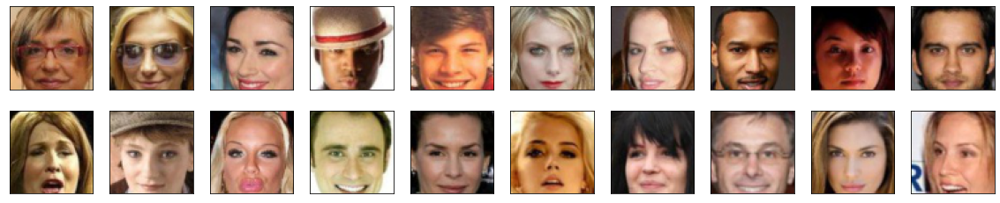

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
def denormalize(tensor):
    return (tensor * 0.5) + 0.5

# Plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size = 20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size / 2), idx + 1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)
plt.show()

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [15]:
from torch.nn import Module

In [46]:
import torch
from torch import nn


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.classifier = nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.classifier(x)
        return x


In [48]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [49]:
import torch
from torch import nn


class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()
        self.fc = nn.Linear(latent_dim, 512 * 4 * 4)
        self.t_conv1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(True)
        )
        self.t_conv2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )
        self.t_conv3 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(True)
        )
        self.t_conv4 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        x = x.view(x.size(0), 512, 4, 4)
        x = self.t_conv1(x)
        x = self.t_conv2(x)
        x = self.t_conv3(x)
        x = self.t_conv4(x)
        return x

In [35]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [36]:
import torch.optim as optim
from torch.nn import Module


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    return g_optimizer, d_optimizer



## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [50]:
import torch
import torch.nn.functional as F


def generator_loss(fake_logits):
    return torch.mean(torch.nn.functional.binary_cross_entropy_with_logits(fake_logits, torch.ones_like(fake_logits)))


### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [51]:
import torch
import torch.nn.functional as F

def discriminator_loss(real_logits, fake_logits):
    real_loss = torch.mean(
        torch.nn.functional.binary_cross_entropy_with_logits(real_logits, torch.ones_like(real_logits)))
    fake_loss = torch.mean(
        torch.nn.functional.binary_cross_entropy_with_logits(fake_logits, torch.zeros_like(fake_logits)))
    return real_loss + fake_loss


### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [52]:
import torch
import torch.autograd as autograd


def gradient_penalty(discriminator, real_samples, fake_samples, device='cuda'):
    """ This function enforces the gradient penalty as discussed in the course """
    batch_size = real_samples.size(0)

    # Interpolate between real and fake samples
    alpha = torch.rand(batch_size, 1, 1, 1, device=device)
    interpolated = alpha * real_samples + (1 - alpha) * fake_samples
    interpolated = interpolated.requires_grad_(True).to(device)

    # Compute the critic scores
    interpolated_logits = discriminator(interpolated)

    # Compute the gradients
    gradients = autograd.grad(
        outputs=interpolated_logits,
        inputs=interpolated,
        grad_outputs=torch.ones(interpolated_logits.size(), device=device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    gradients = gradients.view(batch_size, -1)
    gradient_norm = gradients.norm(2, dim=1)
    penalty = ((gradient_norm - 1) ** 2).mean()

    return penalty


## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [53]:
import torch
from torch import nn
from torch.optim import Optimizer
from typing import Dict


def generator_step(generator, discriminator, optimizer_g, batch_size, latent_dim, device='cuda'):
    noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(noise)
    fake_logits = discriminator(fake_images).view(-1)
    g_loss = generator_loss(fake_logits)
    optimizer_g.zero_grad()
    g_loss.backward()
    optimizer_g.step()
    return {'loss': g_loss.item()}

def discriminator_step(generator, discriminator, optimizer_d, batch_size, latent_dim, real_images, device='cuda'):
    noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(noise)
    real_logits = discriminator(real_images).view(-1)
    fake_logits = discriminator(fake_images.detach()).view(-1)
    d_loss = discriminator_loss(real_logits, fake_logits)
    optimizer_d.zero_grad()
    d_loss.backward()
    optimizer_d.step()
    return {'loss': d_loss.item()}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [54]:
from datetime import datetime

In [55]:
# you can experiment with different dimensions of latent spaces
latent_dim = 100

# update to cpu if you do not have access to a gpu
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

In [56]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [57]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-11-02 05:41:22 | Epoch [1/10] | Batch 0/509 | d_loss: 1.4748 | g_loss: 1.5383
2024-11-02 05:41:28 | Epoch [1/10] | Batch 50/509 | d_loss: 0.1370 | g_loss: 14.4636
2024-11-02 05:41:34 | Epoch [1/10] | Batch 100/509 | d_loss: 0.5734 | g_loss: 1.0497
2024-11-02 05:41:40 | Epoch [1/10] | Batch 150/509 | d_loss: 0.1365 | g_loss: 5.4159
2024-11-02 05:41:46 | Epoch [1/10] | Batch 200/509 | d_loss: 0.4047 | g_loss: 5.9401
2024-11-02 05:41:52 | Epoch [1/10] | Batch 250/509 | d_loss: 2.6944 | g_loss: 5.3637
2024-11-02 05:41:59 | Epoch [1/10] | Batch 300/509 | d_loss: 0.4514 | g_loss: 3.0980
2024-11-02 05:42:05 | Epoch [1/10] | Batch 350/509 | d_loss: 0.3442 | g_loss: 3.2549
2024-11-02 05:42:11 | Epoch [1/10] | Batch 400/509 | d_loss: 0.5776 | g_loss: 4.7658
2024-11-02 05:42:17 | Epoch [1/10] | Batch 450/509 | d_loss: 0.5660 | g_loss: 4.9584
2024-11-02 05:42:23 | Epoch [1/10] | Batch 500/509 | d_loss: 0.5034 | g_loss: 3.9187


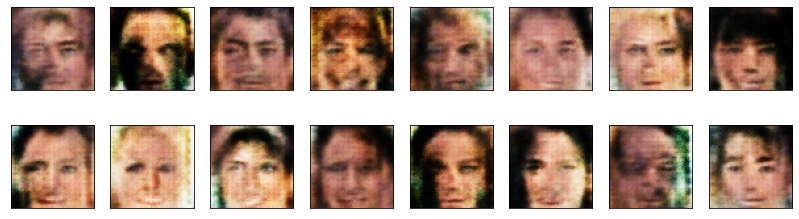

2024-11-02 05:42:27 | Epoch [2/10] | Batch 0/509 | d_loss: 0.1150 | g_loss: 3.3025
2024-11-02 05:42:33 | Epoch [2/10] | Batch 50/509 | d_loss: 1.6772 | g_loss: 0.6522
2024-11-02 05:42:39 | Epoch [2/10] | Batch 100/509 | d_loss: 0.7163 | g_loss: 6.5532
2024-11-02 05:42:45 | Epoch [2/10] | Batch 150/509 | d_loss: 0.4655 | g_loss: 3.2323
2024-11-02 05:42:51 | Epoch [2/10] | Batch 200/509 | d_loss: 5.7915 | g_loss: 4.3807
2024-11-02 05:42:57 | Epoch [2/10] | Batch 250/509 | d_loss: 0.5056 | g_loss: 3.3532
2024-11-02 05:43:03 | Epoch [2/10] | Batch 300/509 | d_loss: 0.3666 | g_loss: 2.8963
2024-11-02 05:43:09 | Epoch [2/10] | Batch 350/509 | d_loss: 0.6138 | g_loss: 4.4794
2024-11-02 05:43:15 | Epoch [2/10] | Batch 400/509 | d_loss: 0.9053 | g_loss: 1.1535
2024-11-02 05:43:21 | Epoch [2/10] | Batch 450/509 | d_loss: 0.3093 | g_loss: 2.7988
2024-11-02 05:43:27 | Epoch [2/10] | Batch 500/509 | d_loss: 0.1838 | g_loss: 3.6402


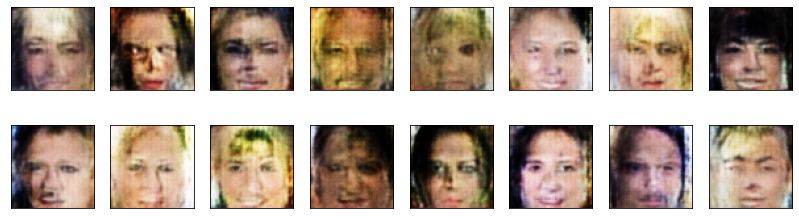

2024-11-02 05:43:32 | Epoch [3/10] | Batch 0/509 | d_loss: 0.2484 | g_loss: 4.9385
2024-11-02 05:43:38 | Epoch [3/10] | Batch 50/509 | d_loss: 0.4156 | g_loss: 1.8103
2024-11-02 05:43:44 | Epoch [3/10] | Batch 100/509 | d_loss: 0.2750 | g_loss: 4.7819
2024-11-02 05:43:50 | Epoch [3/10] | Batch 150/509 | d_loss: 0.2305 | g_loss: 4.3699
2024-11-02 05:43:56 | Epoch [3/10] | Batch 200/509 | d_loss: 0.4124 | g_loss: 3.2420
2024-11-02 05:44:03 | Epoch [3/10] | Batch 250/509 | d_loss: 0.3444 | g_loss: 6.0687
2024-11-02 05:44:09 | Epoch [3/10] | Batch 300/509 | d_loss: 0.0807 | g_loss: 4.5701
2024-11-02 05:44:15 | Epoch [3/10] | Batch 350/509 | d_loss: 0.2518 | g_loss: 4.4583
2024-11-02 05:44:20 | Epoch [3/10] | Batch 400/509 | d_loss: 0.2646 | g_loss: 1.3963
2024-11-02 05:44:26 | Epoch [3/10] | Batch 450/509 | d_loss: 0.5835 | g_loss: 3.5971
2024-11-02 05:44:33 | Epoch [3/10] | Batch 500/509 | d_loss: 0.5004 | g_loss: 4.1964


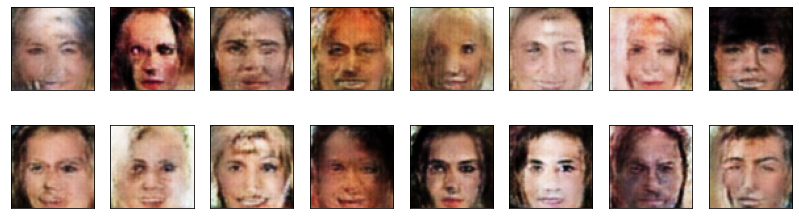

2024-11-02 05:44:37 | Epoch [4/10] | Batch 0/509 | d_loss: 0.2537 | g_loss: 4.9059
2024-11-02 05:44:43 | Epoch [4/10] | Batch 50/509 | d_loss: 0.2610 | g_loss: 3.4454
2024-11-02 05:44:49 | Epoch [4/10] | Batch 100/509 | d_loss: 0.3352 | g_loss: 2.1020
2024-11-02 05:44:55 | Epoch [4/10] | Batch 150/509 | d_loss: 0.1421 | g_loss: 2.3456
2024-11-02 05:45:01 | Epoch [4/10] | Batch 200/509 | d_loss: 0.3229 | g_loss: 3.1686
2024-11-02 05:45:07 | Epoch [4/10] | Batch 250/509 | d_loss: 0.2376 | g_loss: 3.1233
2024-11-02 05:45:13 | Epoch [4/10] | Batch 300/509 | d_loss: 0.1273 | g_loss: 3.4682
2024-11-02 05:45:19 | Epoch [4/10] | Batch 350/509 | d_loss: 0.1855 | g_loss: 2.5480
2024-11-02 05:45:25 | Epoch [4/10] | Batch 400/509 | d_loss: 0.1163 | g_loss: 4.5094
2024-11-02 05:45:31 | Epoch [4/10] | Batch 450/509 | d_loss: 0.3767 | g_loss: 4.3474
2024-11-02 05:45:37 | Epoch [4/10] | Batch 500/509 | d_loss: 0.1213 | g_loss: 3.1766


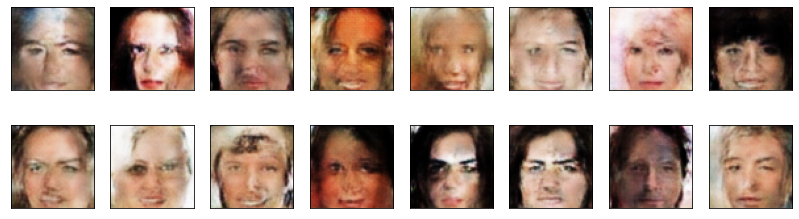

2024-11-02 05:45:42 | Epoch [5/10] | Batch 0/509 | d_loss: 0.4710 | g_loss: 5.4426
2024-11-02 05:45:48 | Epoch [5/10] | Batch 50/509 | d_loss: 0.2578 | g_loss: 2.7134
2024-11-02 05:45:54 | Epoch [5/10] | Batch 100/509 | d_loss: 0.3933 | g_loss: 3.4114
2024-11-02 05:46:00 | Epoch [5/10] | Batch 150/509 | d_loss: 0.3087 | g_loss: 2.7923
2024-11-02 05:46:06 | Epoch [5/10] | Batch 200/509 | d_loss: 0.0608 | g_loss: 4.2411
2024-11-02 05:46:12 | Epoch [5/10] | Batch 250/509 | d_loss: 0.2687 | g_loss: 3.8415
2024-11-02 05:46:18 | Epoch [5/10] | Batch 300/509 | d_loss: 0.1408 | g_loss: 4.1792
2024-11-02 05:46:24 | Epoch [5/10] | Batch 350/509 | d_loss: 0.1436 | g_loss: 4.0217
2024-11-02 05:46:30 | Epoch [5/10] | Batch 400/509 | d_loss: 0.7321 | g_loss: 3.3425
2024-11-02 05:46:36 | Epoch [5/10] | Batch 450/509 | d_loss: 0.2455 | g_loss: 4.2481
2024-11-02 05:46:42 | Epoch [5/10] | Batch 500/509 | d_loss: 1.2057 | g_loss: 6.1388


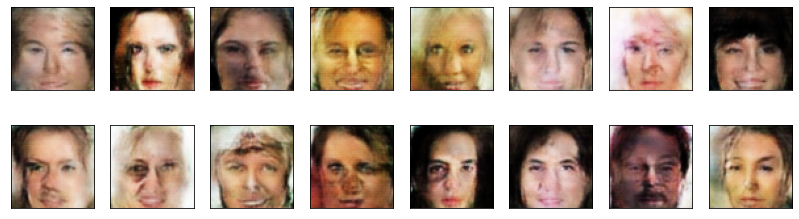

2024-11-02 05:46:48 | Epoch [6/10] | Batch 0/509 | d_loss: 0.2328 | g_loss: 2.7639
2024-11-02 05:46:54 | Epoch [6/10] | Batch 50/509 | d_loss: 0.5538 | g_loss: 4.2301
2024-11-02 05:47:00 | Epoch [6/10] | Batch 100/509 | d_loss: 3.1138 | g_loss: 1.3851
2024-11-02 05:47:06 | Epoch [6/10] | Batch 150/509 | d_loss: 0.1875 | g_loss: 4.2491
2024-11-02 05:47:12 | Epoch [6/10] | Batch 200/509 | d_loss: 0.1786 | g_loss: 2.7245
2024-11-02 05:47:18 | Epoch [6/10] | Batch 250/509 | d_loss: 0.1107 | g_loss: 3.9251
2024-11-02 05:47:24 | Epoch [6/10] | Batch 300/509 | d_loss: 0.2698 | g_loss: 3.3925
2024-11-02 05:47:30 | Epoch [6/10] | Batch 350/509 | d_loss: 0.2085 | g_loss: 3.3939
2024-11-02 05:47:36 | Epoch [6/10] | Batch 400/509 | d_loss: 0.0708 | g_loss: 3.5006
2024-11-02 05:47:41 | Epoch [6/10] | Batch 450/509 | d_loss: 0.2733 | g_loss: 2.9568
2024-11-02 05:47:47 | Epoch [6/10] | Batch 500/509 | d_loss: 0.1913 | g_loss: 2.2323


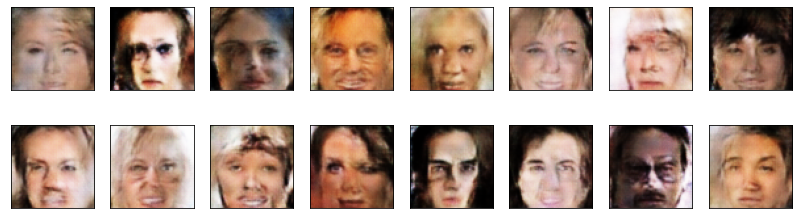

2024-11-02 05:47:52 | Epoch [7/10] | Batch 0/509 | d_loss: 0.1837 | g_loss: 3.4728
2024-11-02 05:47:59 | Epoch [7/10] | Batch 50/509 | d_loss: 1.4116 | g_loss: 1.1883
2024-11-02 05:48:05 | Epoch [7/10] | Batch 100/509 | d_loss: 0.1568 | g_loss: 3.7636
2024-11-02 05:48:11 | Epoch [7/10] | Batch 150/509 | d_loss: 0.2708 | g_loss: 2.7831
2024-11-02 05:48:17 | Epoch [7/10] | Batch 200/509 | d_loss: 0.3447 | g_loss: 2.7780
2024-11-02 05:48:23 | Epoch [7/10] | Batch 250/509 | d_loss: 0.4306 | g_loss: 4.6746
2024-11-02 05:48:29 | Epoch [7/10] | Batch 300/509 | d_loss: 0.1366 | g_loss: 4.9744
2024-11-02 05:48:35 | Epoch [7/10] | Batch 350/509 | d_loss: 0.2351 | g_loss: 3.5169
2024-11-02 05:48:41 | Epoch [7/10] | Batch 400/509 | d_loss: 0.1507 | g_loss: 3.6590
2024-11-02 05:48:47 | Epoch [7/10] | Batch 450/509 | d_loss: 0.1869 | g_loss: 2.5428
2024-11-02 05:48:53 | Epoch [7/10] | Batch 500/509 | d_loss: 0.1060 | g_loss: 4.7765


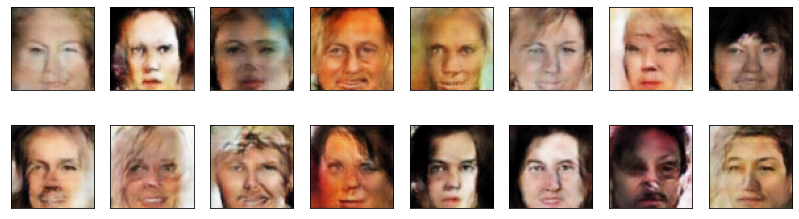

2024-11-02 05:48:58 | Epoch [8/10] | Batch 0/509 | d_loss: 0.5085 | g_loss: 4.5477
2024-11-02 05:49:04 | Epoch [8/10] | Batch 50/509 | d_loss: 0.0697 | g_loss: 4.4687
2024-11-02 05:49:10 | Epoch [8/10] | Batch 100/509 | d_loss: 0.1827 | g_loss: 5.6669
2024-11-02 05:49:16 | Epoch [8/10] | Batch 150/509 | d_loss: 0.2727 | g_loss: 3.7380
2024-11-02 05:49:22 | Epoch [8/10] | Batch 200/509 | d_loss: 0.0642 | g_loss: 2.5747
2024-11-02 05:49:28 | Epoch [8/10] | Batch 250/509 | d_loss: 0.3841 | g_loss: 4.5343
2024-11-02 05:49:34 | Epoch [8/10] | Batch 300/509 | d_loss: 0.4673 | g_loss: 7.3864
2024-11-02 05:49:40 | Epoch [8/10] | Batch 350/509 | d_loss: 0.1767 | g_loss: 4.6059
2024-11-02 05:49:46 | Epoch [8/10] | Batch 400/509 | d_loss: 0.3646 | g_loss: 4.9437
2024-11-02 05:49:52 | Epoch [8/10] | Batch 450/509 | d_loss: 0.8820 | g_loss: 10.0288
2024-11-02 05:49:58 | Epoch [8/10] | Batch 500/509 | d_loss: 0.1943 | g_loss: 5.3634


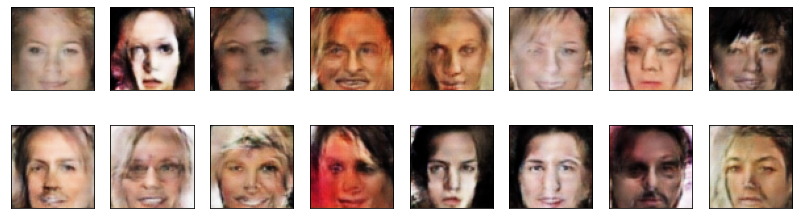

2024-11-02 05:50:03 | Epoch [9/10] | Batch 0/509 | d_loss: 1.8436 | g_loss: 12.6918
2024-11-02 05:50:09 | Epoch [9/10] | Batch 50/509 | d_loss: 0.0374 | g_loss: 5.1596
2024-11-02 05:50:15 | Epoch [9/10] | Batch 100/509 | d_loss: 0.2759 | g_loss: 4.8572
2024-11-02 05:50:21 | Epoch [9/10] | Batch 150/509 | d_loss: 3.8026 | g_loss: 0.9486
2024-11-02 05:50:27 | Epoch [9/10] | Batch 200/509 | d_loss: 0.2114 | g_loss: 4.9036
2024-11-02 05:50:33 | Epoch [9/10] | Batch 250/509 | d_loss: 0.4663 | g_loss: 3.4443
2024-11-02 05:50:39 | Epoch [9/10] | Batch 300/509 | d_loss: 0.1865 | g_loss: 3.8134
2024-11-02 05:50:45 | Epoch [9/10] | Batch 350/509 | d_loss: 0.6757 | g_loss: 2.3075
2024-11-02 05:50:51 | Epoch [9/10] | Batch 400/509 | d_loss: 0.1399 | g_loss: 3.0225
2024-11-02 05:50:57 | Epoch [9/10] | Batch 450/509 | d_loss: 0.0578 | g_loss: 4.5175
2024-11-02 05:51:03 | Epoch [9/10] | Batch 500/509 | d_loss: 0.1284 | g_loss: 5.6258


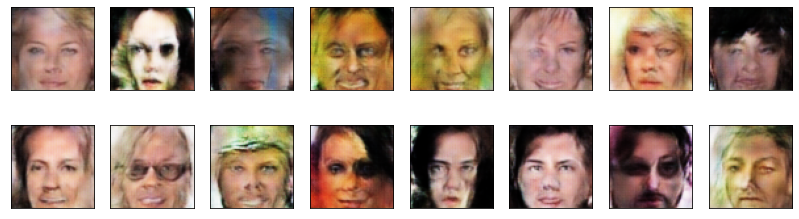

2024-11-02 05:51:08 | Epoch [10/10] | Batch 0/509 | d_loss: 0.6974 | g_loss: 6.0732
2024-11-02 05:51:14 | Epoch [10/10] | Batch 50/509 | d_loss: 0.3016 | g_loss: 6.7764
2024-11-02 05:51:20 | Epoch [10/10] | Batch 100/509 | d_loss: 0.1524 | g_loss: 5.9433
2024-11-02 05:51:26 | Epoch [10/10] | Batch 150/509 | d_loss: 0.2149 | g_loss: 2.8884
2024-11-02 05:51:32 | Epoch [10/10] | Batch 200/509 | d_loss: 0.1014 | g_loss: 4.1117
2024-11-02 05:51:38 | Epoch [10/10] | Batch 250/509 | d_loss: 0.0375 | g_loss: 0.4590
2024-11-02 05:51:44 | Epoch [10/10] | Batch 300/509 | d_loss: 0.0457 | g_loss: 5.0205
2024-11-02 05:51:50 | Epoch [10/10] | Batch 350/509 | d_loss: 0.0634 | g_loss: 4.4194
2024-11-02 05:51:56 | Epoch [10/10] | Batch 400/509 | d_loss: 0.0301 | g_loss: 6.3382
2024-11-02 05:52:02 | Epoch [10/10] | Batch 450/509 | d_loss: 0.1519 | g_loss: 4.5377
2024-11-02 05:52:08 | Epoch [10/10] | Batch 500/509 | d_loss: 0.0126 | g_loss: 5.2867


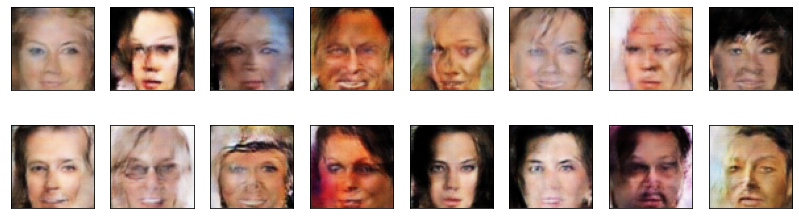

In [58]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        d_loss = discriminator_step(generator, discriminator, d_optimizer, batch_size, latent_dim, real_images,
                                    device=device)
        g_loss = generator_step(generator, discriminator, g_optimizer, batch_size, latent_dim, device=device)

        if batch_i % print_every == 0:
            d = d_loss['loss']
            g = g_loss['loss']
            losses.append((d, g))
            time = str(datetime.now()).split('.')[0]
            print(
                f'{time} | Epoch [{epoch + 1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')

    generator.eval()
    with torch.no_grad():
        generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

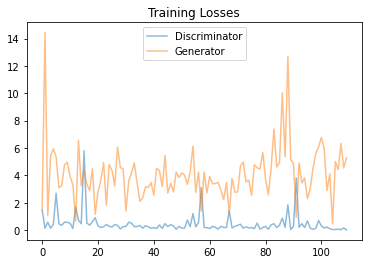

In [59]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

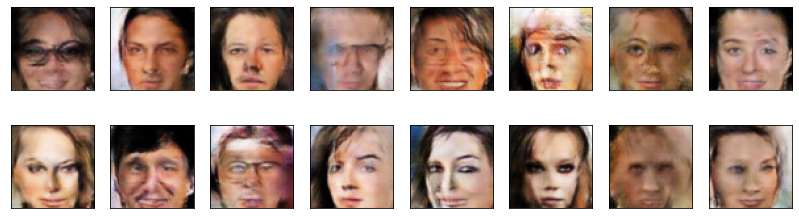

In [60]:
from typing import List
import torch


def view_samples(generator: nn.Module, fixed_latent_vector: torch.Tensor, num_samples: int = 16, latent_dim: int = 128,
                 device='cuda'):
    """
    Generate and display samples from the generator.

    Args:
        generator (nn.Module): Trained generator model.
        fixed_latent_vector (torch.Tensor): Fixed latent vector for visualization.
        num_samples (int): Number of samples to generate (max 16).
        latent_dim (int): Dimension of the latent space.
        device (str): Device to perform the operation on.
    """
    # Ensure the generator is in eval mode
    generator.eval()

    # Generate images
    samples = generator(fixed_latent_vector[:num_samples].to(device))

    # Display images
    display(samples)

# Generate samples
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)
view_samples(generator, fixed_latent_vector)


### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 

#### Dataset Bias
**Observation**:
- The dataset primarily consists of celebrity faces, which are predominantly white. This bias can significantly affect the diversity of the generated samples. You might notice that the generated faces lack diversity in terms of ethnicity, gender, and other features.

**Improvement**:
- Use a more diverse dataset that includes a wider range of facial features, skin tones, ages, and genders. This will help the model learn a more comprehensive feature space and generate diverse and representative faces.

#### Model Size
**Observation**:
- Larger models have the capacity to learn more complex features. If the generated samples are lacking detail or appear overly simplistic, it might be due to the insufficient capacity of the current model.

**Improvement**:
- Increase the size of both the Generator and Discriminator networks. You can add more layers or increase the number of filters in each convolutional layer. Be cautious of overfitting, especially if the dataset size is limited.

#### Optimization Strategy
**Observation**:
- The choice of optimizer and the number of training epochs significantly influence the training process. If the generated samples are not improving, or training is unstable, the current optimizer or learning rate might not be ideal.

**Improvement**:
- Experiment with different optimizers like RMSprop, AdamW, or different hyperparameters for the existing Adam optimizer. Additionally, you may consider a learning rate scheduler to adjust the learning rate dynamically during training.
- Increase the number of training epochs but keep an eye on the training loss to avoid overfitting. Sometimes, training for more epochs with early stopping based on a validation set can yield better results.

#### Loss Functions
**Observation**:
- If the loss functions are not appropriately capturing the distance between real and fake distributions, the generated samples may not be realistic. The Binary Cross-Entropy loss used might not be the best choice for all types of GAN architectures.

**Improvement**:
- Consider using different loss functions. For example, Least Squares GAN (LSGAN), WGAN-GP (Wasserstein GAN with Gradient Penalty) can often yield more stable training and better results for image generation tasks.
- Additionally, implement feature matching or use perceptual loss to improve the quality of generated images. Perceptual loss, which uses pre-trained networks like VGG to compute loss based on high-level feature map differences, can enhance the generated image quality.


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.

In [ ]:
!jupyter nbconvert --to html *.ipynb

[NbConvertApp] Converting notebook dlnd_face_generation_starter.ipynb to html
